In [1]:
# Initializing:
import pandas as pd
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype
import numpy as np
import matplotlib.pyplot as plt

# Needed to make plots display at a decent size:
plt.rcdefaults()

# Github URLs where I uploaded the data files; using this instead of the Kaggle
# website, as the latter requires logging in to download the CSV files + they can only
# be downloaded as a ZIP folder; so Github raw files is a good alternative:
URL = "https://github.com/MikeSchotten/Module_5__Assignment/raw/main/attacks.csv"

# Read in the data CSV file.  The encoding="unicode-escape" addition
# is needed to prevent an error in pandas (UTF-8 had problems with some data cells):
df_raw = pd.read_csv(URL, encoding="unicode_escape")

display(df_raw)


,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,...,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,...,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,...,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
# NOTE TO WINC INSTRUCTORS:
# 
# I'm guessing that the following code doesn't work if you haven't 
# installed the itables library on your machine.  If so, you can simply 
# delete this cell or comment it out.
# ----------------------------------------------------------------------


# Bcs. I don't want to use G. Colabs, and therefore don't have access to Data Tables,
# I imported the itables library instead.  This has similar functionality,
# and also works in Jupyter Notebooks.
# Documentation: https://mwouts.github.io/itables/quick_start.html

from itables import init_notebook_mode, show
init_notebook_mode(all_interactive=False)
# init_notebook_mode(all_interactive=True)

import itables.options as opt
opt.order = []  # No sorting by default; so display DF exactly as the original CSV file
opt.classes = ["display", "cell-border"]   # Show borders between table cells
opt.lengthMenu = [5, 7, 10, 20, 50, 100, 200]  # Customize menu with nr. of rows shown per page
opt.column_filters = "footer"  # Show filters at bottom of table

# Set column width; if you don't do this, the column headers and data become illegible.
opt.columnDefs = [{"width": "75px", "targets": "_all"}]

# Set option to display ALL columns 
# (default = pd.get_option('display.max_columns') = 20 columns max):
opt.maxColumns = 0

# # Turn on the following lines with maxBytes=True to show ALL data (but note, can be very heavy 
# # on Notebook, so recommended to turn off again after use):
show(
    df_raw,
    scrolly="1000px",
    maxBytes=0
)

# Or instead, show shortened DF table:
# show(df_raw)



<IPython.core.display.Javascript object>

In [3]:
# As some of the column headers contain invisible whitespaces at the end,
# remove those first, otherwise they can't be easily referenced:
df_raw.columns = df_raw.columns.str.strip()

# Remove columns that are unneeded for the questions asked:
df = df_raw.drop(axis=1, columns=df_raw.loc[:, 'Investigator or Source':])
df = df.drop(axis=1, columns=['Date', 'Year', 'Country', 'Area', 'Name', 'Sex'])

display(df)


,Case Number,Type,Location,Activity,Age,Injury,Fatal (Y/N),Time,Species
0,2018.06.25,Boating,"Oceanside, San Diego County",Paddling,57,"No injury to occupant, outrigger canoe and pad...",N,18h00,White shark
1,2018.06.18,Unprovoked,"St. Simon Island, Glynn County",Standing,11,Minor injury to left thigh,N,14h00 -15h00,NaN
2,2018.06.09,Invalid,"Habush, Oahu",Surfing,48,Injury to left lower leg from surfboard skeg,N,07h45,NaN
3,2018.06.08,Unprovoked,Arrawarra Headland,Surfing,NaN,Minor injury to lower leg,N,NaN,2 m shark
4,2018.06.04,Provoked,La Ticla,Free diving,NaN,Lacerations to leg & hand shark PROVOKED INCIDENT,N,NaN,"Tiger shark, 3m"
...,...,...,...,...,...,...,...,...,...
25718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Decapitalize column headers:
df.columns = [column.lower() for column in df.columns]

# Rename a few other columns for easier reference:
df = df.rename(columns={
    'case number': 'case_nr',
    'fatal (y/n)': 'fatal_bool',
})

# Show column index:
display(df.columns)


Index(['case_nr', 'type', 'location', 'activity', 'age', 'injury',
       'fatal_bool', 'time', 'species'],
      dtype='object')

In [5]:
# Function to remove leading and trailing whitespace from 'object'
# datatype (especially strings) - so similar to the TRIM function
# in Excel - as well as removing all duplicate spaces WITHIN each string.
# 
# The function applies this to all columns in the input DateFrame
# that are of the 'object' dtype, using the .map() method to replace
# all values in the column.  Note that this only works with the
# na_action='ignore' parameter, otherwise it throws an error for 
# NaN missing values (which are float64 dtype).
# 
# This function was modified from:
# https://www.geeksforgeeks.org/pandas-strip-whitespace-from-entire-dataframe/
# To remove duplicate spaces WITHIN strings,the Python regular expression 
# .sub() method was used, see https://docs.python.org/3/library/re.html#re.sub
# and https://www.datasciencemadesimple.com/remove-spaces-in-python/ 


def whitespace_remover(dataframe):
    # Inner function to remove whitespace from single string:
    def str_whitespace_remover(string):
        import re
        cleaned_string = re.sub(' +', ' ', string).strip()
        return cleaned_string
        
    # Iterating over the columns:
    for i in dataframe.columns:

        # Checking datatype of each column:
        if dataframe[i].dtype == 'object':
            # # If needed for checking, print columns that were converted:
            print(f'Column "{i}":  dtype = {dataframe[i].dtype}')
            
            dataframe[i] = dataframe[i].map(str_whitespace_remover, na_action='ignore')
           
        else:
            # For columns with dtype other than 'object', do nothing:
            pass


In [6]:
# Remove all excess whitespace from data points:
whitespace_remover(df)

# Drop rows where ALL columns have default missing values:
df = df.dropna(how="all")
df


Column "case_nr":  dtype = object
Column "type":  dtype = object
Column "location":  dtype = object
Column "activity":  dtype = object
Column "age":  dtype = object
Column "injury":  dtype = object
Column "fatal_bool":  dtype = object
Column "time":  dtype = object
Column "species":  dtype = object


,case_nr,type,location,activity,age,injury,fatal_bool,time,species
0,2018.06.25,Boating,"Oceanside, San Diego County",Paddling,57,"No injury to occupant, outrigger canoe and pad...",N,18h00,White shark
1,2018.06.18,Unprovoked,"St. Simon Island, Glynn County",Standing,11,Minor injury to left thigh,N,14h00 -15h00,NaN
2,2018.06.09,Invalid,"Habush, Oahu",Surfing,48,Injury to left lower leg from surfboard skeg,N,07h45,NaN
3,2018.06.08,Unprovoked,Arrawarra Headland,Surfing,NaN,Minor injury to lower leg,N,NaN,2 m shark
4,2018.06.04,Provoked,La Ticla,Free diving,NaN,Lacerations to leg & hand shark PROVOKED INCIDENT,N,NaN,"Tiger shark, 3m"
...,...,...,...,...,...,...,...,...,...
8698,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8699,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8700,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8701,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# Also show itables of cleaned & reduced DataFrame:

# show(
#     df,
#     scrolly="1000px",
#     maxBytes=0
# )

In [8]:
# PRELIMINARY ANALYSIS OF OVERALL DATASET
# 
# FINDING NON-DEFAULT NULL VALUES PER COLUMN

# Strategy 1: look at unique values
# 
# Show nr. of unique values in each column:
display(df.nunique())

case_nr       6287
type             8
location      4052
activity      1504
age            149
injury        3646
fatal_bool       6
time           359
species       1437
dtype: int64

In [9]:
# PRE-ANALYSIS
# Strategy 2: sorting & looking at the edges
# 

print("First and last five unique values of each sorted column:\n")

# For each column, first sort and then take the unique values.
# If a column has less than 10 unique values, display all of them,
# otherwise display the first 5 and last 5 sorted unique values.
for column in df.columns:
    if len(df.loc[:, column].sort_values().unique()) < 10:
        print(f'{column}: {df.loc[:,column].sort_values().unique()}')
    else:
        print(f'{column}: {df.loc[:,column].sort_values().unique()[[0,1,2,3,4,-5,-4,-3,-2,-1]]}')


First and last five unique values of each sorted column:

case_nr: ['0' '0000.0214' '0000.0336' '0000.0493' '0000.0725' 'ND.0102' 'ND.0104'
 'ND.0110' 'xx' nan]
type: ['Boat' 'Boating' 'Boatomg' 'Invalid' 'Provoked' 'Questionable'
 'Sea Disaster' 'Unprovoked' nan]
location: ['' '"Bellynahinch" on the Manning River'
 '"Bunkers" Eureka, Humboldt County' '"Stuart Rocks", Martin County'
 '"Turnaround", Cape Kiwanda, Tillamook County'
 '½ mile offshore & 9 miles north of Fort Pierce' 'Île Saint-Paul'
 'Île de Casey' 'Île de Sable' nan]
activity: ['' '"Boat accident"'
 '"Climbing up to ship after repairing the stern in water"'
 '"Crossing the river"'
 '"Flying Tiger" transport plane went down with 5 men onboard'
 'small boat' 'wreck of the State Oil Company ship Permina'
 'yachting accident' 'yachtsman in a zodiac' nan]
age: ['' '"middle-age"' '"young"' '(adult)' '1' 'mid-20s' 'mid-30s' 'teen'
 'young' nan]
injury: ['"Bad wound in the leg" - 7-ft shark caught in the bath same day'
 '"Badly b

In [10]:
# PRE-ANALYSIS
# Strategy 4: Looking at the frequency
# 

# Define custom functions to show the x nr. of most occurring and 
# y nr. of least occurring unique values, both in each column and
# for all columns in the DataFrame.
# Having these as functions makes it easy to reuse them again
# if necessary, e.g. after the df has been cleaned:

def column_value_counts(df, column, head_nr, tail_nr):
    # Only print x nr. of head and y nr. of tail values of the .value_counts() Series
    # (= df column) if there are x+y or more unique values in the column.
    # Otherwise (i.e. if the column has less than x+y unique values), print 
    # the entire .value_counts() Series.
    if len(df[column].unique()) >= (head_nr + tail_nr):
        print(f'Column "{column}":\n\n(HEAD)   \
                            \n{df[column].value_counts(dropna=False).iloc[:head_nr]}\
                            \n....\
                            \n(TAIL)   \
                            \n{df[column].value_counts(dropna=False).iloc[-tail_nr:]}\
                            \n\n----------------------------------------------\n')
    else:
        print(f'Column "{column}":\n\n{df[column].value_counts(dropna=False)}\
                            \n\n----------------------------------------------\n')
    


def df_value_counts_per_column(df, head_nr, tail_nr):
    print(f"Show the {head_nr} most and {tail_nr} least frequently " \
           "occuring values of each column:\n")
    for column in df.columns:
        column_value_counts(df, column, head_nr, tail_nr)
    
df_value_counts_per_column(df, 60, 10)


Show the 60 most and 10 least frequently occuring values of each column:

Column "case_nr":

(HEAD)                               
0                 2400
2009.12.18           2
1990.05.10           2
1907.10.16.R         2
1913.08.27.R         2
1983.06.15           2
1962.06.11.b         2
2005.04.06           2
1980.07.00           2
1966.12.26           2
1915.07.06.a.R       2
2014.08.02           2
1923.00.00.a         2
2012.09.02.b         2
2006.09.02           2
1920.00.00.b         2
2013.10.05           2
1957.04.13           1
1957.04.07.a         1
1957.02.24           1
1957.04.07.b         1
1957.02.05           1
2018.06.25           1
1957.04.22           1
1957.04.23           1
1957.04.28           1
1957.02.02           1
1957.05.07           1
1957.05.11           1
1957.06.21           1
1957.07.09           1
1957.07.15           1
1957.07.24           1
1957.05.00           1
1957.00.00.k         1
1957.02.00           1
1957.01.05           1
1956.10.00        

In [11]:
# FULL ANALYSIS PER COLUMN
# 
# (Using Niels' code from the Winc Academy solution)


# Set up functions for 3 of the 4 strategies to find
# non-default missing values.  By making functions of these,
# we can easily repeat these steps for each of the 20 columns.
# 
# The 4th strategy (looking at the frequency) can be simply
# done using the .value_counts() method.


# Print header at the top, for visual demarcation
# every time we check these 4 steps for a column.
# Depending on the input arguments, this can either be
# a more outspoken demarcation between the overall check 
# for each column, as well as a less pronounced demarcation 
# between each of the 4 steps for a single column.
# See also the top-level function "find_non_default_missing_values()"
# in the next cell how this has been implemented.
def print_separator(sep, num, msg):
    print("\n")
    print(sep * num)
#     print(f"{msg}")
    print(f"\n{msg}\n")
    print(sep * num)
    print("\n")


# Strategy A: Looking at the unique values
def look_at_unique_values(column):
    unique_values_cutoff = 160
    unique_values = column.unique()
    num_unique_values = len(unique_values)
    if num_unique_values == len(column):
        print(f"Each value in the column is unique (total: {num_unique_values})")
    elif num_unique_values < unique_values_cutoff:
        print(f"Less than {unique_values_cutoff} unique values in the column.")
        # We may get an error when sorting
        try:
            sorted = np.sort(unique_values)
            print("The unique values (sorted here) are:")
            display(list(sorted))
        except:
            print("Could not sort these unique values.")
            display(list(unique_values))
    else:
        print(f"There are more than {unique_values_cutoff} unique values (total: {num_unique_values})")


# Strategy B: Sorting and looking at the edges
def look_at_edges(df, column_name):
    # Inner function to show head and tail of the COLUMN values;
    # Note that this is different from the 'regular' head() and tail()
    # functions of a DF, which will show the complete rows.
    def show_head_and_tail(values):
        num_items_to_slice = 10
        display(list(values)[:num_items_to_slice])   # head
        display(list(values)[-num_items_to_slice:])  # tail
    
    column = df[column_name]
    unique_values = column.unique()
    try:
        sorted = np.sort(unique_values)
        print("Unique values sorted, head and tail:")
        show_head_and_tail(sorted)
    except TypeError as error:
        print(f"Could not sort values: {error}")
        print("..so let's try filtering out the (default) NULL values and then sorting.")
        # Logic: with .loc[], select all rows in the df of which the desired column
        # does NOT contain default NULL values (boolean mask), so only the rows with
        # 'regular' values, then select only that column of the df, then find the unique values:
        non_null_uniques = df.loc[~df[column_name].isnull(), column_name].unique()
        # Note that the following sort could STILL throw an error,
        # namely if there are still different types of values in the column.
        # E.g., any NON-default NULL values, such as a string in a column of floats.
        # If that happens, a new error message will appear that will still
        # give us this valuable info.        
        sorted = np.sort(non_null_uniques)
        show_head_and_tail(sorted)


# Strategy C: Casting to a type
def cast_to_type(column, maybe_type):
    try:
        column.astype(maybe_type)
        print(f"Casting to {maybe_type} was successful")
    except ValueError as error:
        print(f"Could not cast to {maybe_type}: {error}")


In [12]:
# And this top-level function combines all functions
# from the previous cell, to find the non-default missing values
# (using each of the 4 strategies) in a generic column
# from a generic DataFrame:

def find_non_default_missing_values(df, column_name, maybe_type):
    long_separator_amount = 80
    short_separator_amount = 40
    
    print_separator("*", long_separator_amount, f"Finding non default missing values for column \"{column_name}\"")
    
    print(f"Column \"{column_name}\" has datatype: {df.dtypes[column_name]}")
    # Note that the above info about datatype of the column can
    # already provide a lot of info.  If it says, datatype: object
    # while all data look to be of a certain type, this indicates
    # there might be other datatypes = potentially missing values
    # in there (but not necessarily, this might also be caused by
    # how pandas reads in the DF).
    
    column = df[column_name]
    
    # A
    print_separator("-", short_separator_amount, "A: Looking at unique values")
    look_at_unique_values(column)
    
    # B
    print_separator("-", short_separator_amount, "B: Sorting and looking at the edges")
    look_at_edges(df, column_name)
    
    # C
    print_separator("-", short_separator_amount, f"C: Casting to type: {maybe_type}")
    cast_to_type(column, maybe_type)
    # It turns out for this particular dataset (questionnaire A), casting to 
    # the prominent datatype in that column is always successful, so is not helpful
    # in that regard.
        
    # D
    print_separator("-", short_separator_amount, "D: Looking at frequency")
    # The (dropna=False) is necessary to also show the
    # default NULL values.  In 2021, pandas still showed all
    # 3 default NULL values as NaN, but I believe this 
    # has now been fixed (in June 2022).
    display(column.value_counts(dropna=False))
    
    print("\n")


In [13]:
# Functions to replace the non-default NULL values
# that were found in the previous steps:

# Helper functions:

def replace_value(df, column_name, missing_old, missing_new):
    # ⚠️ Mutates df
    df[column_name] = df[column_name].replace({missing_old: missing_new})

def display_default_null_values(df, column_name):
    nulls = df.loc[df[column_name].isnull()]
    print(f"Number of default null values in \"{column_name}\": {len(nulls)}")

# Easier to type
nat = np.datetime64('nat')

In [14]:
# Column names again:

display(df.columns)

Index(['case_nr', 'type', 'location', 'activity', 'age', 'injury',
       'fatal_bool', 'time', 'species'],
      dtype='object')

In [15]:
# Now check each column using functions defined above.
# 

# Column 'case_nr':
find_non_default_missing_values(df, 'case_nr', 'object')
replace_value(df, 'case_nr', np.nan, None)
replace_value(df, 'case_nr', '0', None)
replace_value(df, 'case_nr', 'xx', None)
find_non_default_missing_values(df, 'case_nr', 'object')




********************************************************************************

Finding non default missing values for column "case_nr"

********************************************************************************


Column "case_nr" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 6288)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['0',
 '0000.0214',
 '0000.0336',
 '0000.0493',
 '0000.0725',
 '0005.00.00',
 '0077.00.00',
 '0500.00.00',
 '1543.00.00',
 '1554.00.00']

['ND.0093',
 'ND.0094',
 'ND.0095',
 'ND.0096',
 'ND.0097',
 'ND.0100',
 'ND.0102',
 'ND.0104',
 'ND.0110',
 'xx']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




0               2400
2009.12.18         2
1990.05.10         2
1907.10.16.R       2
1913.08.27.R       2
                ... 
1999.09.04.b       1
1999.09.05         1
1999.09.10         1
1999.09.16         1
xx                 1
Name: case_nr, Length: 6288, dtype: int64





********************************************************************************

Finding non default missing values for column "case_nr"

********************************************************************************


Column "case_nr" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 6286)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['0000.0214',
 '0000.0336',
 '0000.0493',
 '0000.0725',
 '0005.00.00',
 '0077.00.00',
 '0500.00.00',
 '1543.00.00',
 '1554.00.00',
 '1555.00.00']

['ND.0091',
 'ND.0093',
 'ND.0094',
 'ND.0095',
 'ND.0096',
 'ND.0097',
 'ND.0100',
 'ND.0102',
 'ND.0104',
 'ND.0110']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None            2402
1990.05.10         2
1983.06.15         2
2006.09.02         2
2012.09.02.b       2
                ... 
1999.09.05         1
1999.09.10         1
1999.09.16         1
1999.09.18         1
ND.0001            1
Name: case_nr, Length: 6286, dtype: int64

In [16]:
# Column 'type':
find_non_default_missing_values(df, 'type', 'object')
replace_value(df, 'type', np.nan, None)
replace_value(df, 'type', 'Questionable', None)
replace_value(df, 'type', 'Invalid', None)
replace_value(df, 'type', 'Boat', 'Boating')
replace_value(df, 'type', 'Boatomg', 'Boating')
find_non_default_missing_values(df, 'type', 'object')




********************************************************************************

Finding non default missing values for column "type"

********************************************************************************


Column "type" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


Less than 160 unique values in the column.
Could not sort these unique values.


['Boating',
 'Unprovoked',
 'Invalid',
 'Provoked',
 'Questionable',
 'Sea Disaster',
 nan,
 'Boat',
 'Boatomg']



----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['Boat',
 'Boating',
 'Boatomg',
 'Invalid',
 'Provoked',
 'Questionable',
 'Sea Disaster',
 'Unprovoked']

['Boat',
 'Boating',
 'Boatomg',
 'Invalid',
 'Provoked',
 'Questionable',
 'Sea Disaster',
 'Unprovoked']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




Unprovoked      4595
NaN             2405
Provoked         574
Invalid          547
Sea Disaster     239
Boating          203
Boat             137
Questionable       2
Boatomg            1
Name: type, dtype: int64





********************************************************************************

Finding non default missing values for column "type"

********************************************************************************


Column "type" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


Less than 160 unique values in the column.
Could not sort these unique values.


['Boating', 'Unprovoked', None, 'Provoked', 'Sea Disaster']



----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['Boating', 'Provoked', 'Sea Disaster', 'Unprovoked']

['Boating', 'Provoked', 'Sea Disaster', 'Unprovoked']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




Unprovoked      4595
None            2954
Provoked         574
Boating          341
Sea Disaster     239
Name: type, dtype: int64

In [17]:
# Column 'location':
find_non_default_missing_values(df, 'location', 'object')
replace_value(df, 'location', np.nan, None)
replace_value(df, 'location', '', None)
find_non_default_missing_values(df, 'location', 'object')




********************************************************************************

Finding non default missing values for column "location"

********************************************************************************


Column "location" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 4053)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['',
 '"Bellynahinch" on the Manning River',
 '"Bunkers" Eureka, Humboldt County',
 '"Stuart Rocks", Martin County',
 '"Turnaround", Cape Kiwanda, Tillamook County',
 '(Calcutta?)',
 '(Point Sinclair) Penong',
 "1 km off Black's Beach",
 '1 km off the mouth of Marsa Bereika, north of Ras Mohammed',
 '1 mile ESE of Navesink, Monmouth County']

['off Neuvitas',
 'off Paoay, Ilocos Norte Province',
 'off yacht Serenade',
 'the pearling beds',
 'uShaka Aquarium, Durban',
 '\x93Southern Wharf\x94',
 '½ mile offshore & 9 miles north of Fort Pierce',
 'Île Saint-Paul',
 'Île de Casey',
 'Île de Sable']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




NaN                                               2941
New Smyrna Beach, Volusia County                   170
Daytona Beach, Volusia County                       34
Cocoa Beach, Brevard County                         25
Ponce Inlet, Volusia County                         20
                                                  ... 
Off Port Alfred                                      1
Clam Beach, near Eureka, Humboldt County             1
East Beach, Galveston                                1
Carysfort Lighthouse, Key Largo, Monroe County       1
Below the English fort, Trincomalee                  1
Name: location, Length: 4053, dtype: int64





********************************************************************************

Finding non default missing values for column "location"

********************************************************************************


Column "location" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 4052)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"Bellynahinch" on the Manning River',
 '"Bunkers" Eureka, Humboldt County',
 '"Stuart Rocks", Martin County',
 '"Turnaround", Cape Kiwanda, Tillamook County',
 '(Calcutta?)',
 '(Point Sinclair) Penong',
 "1 km off Black's Beach",
 '1 km off the mouth of Marsa Bereika, north of Ras Mohammed',
 '1 mile ESE of Navesink, Monmouth County',
 '1 mile off Mala Wharf, Lahaina, Maui']

['off Neuvitas',
 'off Paoay, Ilocos Norte Province',
 'off yacht Serenade',
 'the pearling beds',
 'uShaka Aquarium, Durban',
 '\x93Southern Wharf\x94',
 '½ mile offshore & 9 miles north of Fort Pierce',
 'Île Saint-Paul',
 'Île de Casey',
 'Île de Sable']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None                                                               2942
New Smyrna Beach, Volusia County                                    170
Daytona Beach, Volusia County                                        34
Cocoa Beach, Brevard County                                          25
Ponce Inlet, Volusia County                                          20
                                                                   ... 
Waiokapua Bay/Majors Bay, Brennecke Beach, Poipu, Kaua'i Island       1
Off Port Alfred                                                       1
Clam Beach, near Eureka, Humboldt County                              1
East Beach, Galveston                                                 1
Below the English fort, Trincomalee                                   1
Name: location, Length: 4052, dtype: int64

In [18]:
# Column 'activity':
find_non_default_missing_values(df, 'activity', 'object')
replace_value(df, 'activity', np.nan, None)
replace_value(df, 'activity', '', None)
replace_value(df, 'activity', '.', None)
find_non_default_missing_values(df, 'activity', 'object')




********************************************************************************

Finding non default missing values for column "activity"

********************************************************************************


Column "activity" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 1505)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['',
 '"Boat accident"',
 '"Climbing up to ship after repairing the stern in water"',
 '"Crossing the river"',
 '"Flying Tiger" transport plane went down with 5 men onboard',
 '"Riding waves on a board"',
 '"Swimming vigorously"',
 '.',
 "12 of the Penang's crew were returning to the ship when their 12' dinghy capsized",
 '13 men in the water after sailboat capsized & sank']

['preparing to go skin diving',
 'pêcheur de bichiques',
 'seaplane Columbus ditched in the sea',
 'ship M.V. Rizal sank during typhoon',
 'ship William Penn grounded & broke apart',
 'ship torpedoed 400 miles off the African coas. Man was clinging to hatch cover',
 'small boat',
 'wreck of the State Oil Company ship Permina',
 'yachting accident',
 'yachtsman in a zodiac']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




NaN                                       2945
Surfing                                    976
Swimming                                   916
Fishing                                    444
Spearfishing                               340
                                          ... 
Dynamite fishing                             1
Leaving the water                            1
Playing with a frisbee in the shallows       1
Sinking of the ferryboat Dumaguete           1
Wreck of large double sailing canoe          1
Name: activity, Length: 1505, dtype: int64





********************************************************************************

Finding non default missing values for column "activity"

********************************************************************************


Column "activity" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 1503)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"Boat accident"',
 '"Climbing up to ship after repairing the stern in water"',
 '"Crossing the river"',
 '"Flying Tiger" transport plane went down with 5 men onboard',
 '"Riding waves on a board"',
 '"Swimming vigorously"',
 "12 of the Penang's crew were returning to the ship when their 12' dinghy capsized",
 '13 men in the water after sailboat capsized & sank',
 '14 m prawn trawler New Venture capsized & sank in heavy seas Three people in the water',
 '1446-ton Norwegian barque Errol, bound from Peru to Newcastle with 22 on board wrecked. Survivors shelterd on the wreck of the Annasona. Subsequently the Master, his wife & 4 children perished along with several crew. Survivors (5) were rescued 7/12/1909']

['preparing to go skin diving',
 'pêcheur de bichiques',
 'seaplane Columbus ditched in the sea',
 'ship M.V. Rizal sank during typhoon',
 'ship William Penn grounded & broke apart',
 'ship torpedoed 400 miles off the African coas. Man was clinging to hatch cover',
 'small boat',
 'wreck of the State Oil Company ship Permina',
 'yachting accident',
 'yachtsman in a zodiac']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None                                      2950
Surfing                                    976
Swimming                                   916
Fishing                                    444
Spearfishing                               340
                                          ... 
Dynamite fishing                             1
Leaving the water                            1
Playing with a frisbee in the shallows       1
Sinking of the ferryboat Dumaguete           1
Wreck of large double sailing canoe          1
Name: activity, Length: 1503, dtype: int64

In [19]:
# Column 'age':
find_non_default_missing_values(df, 'age', 'object')
replace_value(df, 'age', np.nan, None)
replace_value(df, 'age', '', None)
replace_value(df, 'age', 'X', None)
replace_value(df, 'age', 'MAKE LINE GREEN', None)
replace_value(df, 'age', 'F', None)  # Assumed that 'F' was meant for 'Sex' column
replace_value(df, 'age', 'A.M.', None) # Assumed that 'A.M.' was meant for 'Time' column
find_non_default_missing_values(df, 'age', 'object')




********************************************************************************

Finding non default missing values for column "age"

********************************************************************************


Column "age" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


Less than 160 unique values in the column.
Could not sort these unique values.


['57',
 '11',
 '48',
 nan,
 '18',
 '52',
 '15',
 '12',
 '32',
 '10',
 '21',
 '34',
 '30',
 '60',
 '33',
 '29',
 '54',
 '41',
 '37',
 '56',
 '19',
 '25',
 '69',
 '38',
 '55',
 '35',
 '46',
 '45',
 '14',
 '40s',
 '28',
 '20',
 '24',
 '26',
 '49',
 '22',
 '7',
 '31',
 '17',
 '40',
 '13',
 '42',
 '3',
 '8',
 '50',
 '16',
 '82',
 '73',
 '20s',
 '68',
 '51',
 '39',
 '58',
 'Teen',
 '47',
 '61',
 '65',
 '36',
 '66',
 '43',
 '60s',
 '9',
 '72',
 '59',
 '6',
 '27',
 '64',
 '23',
 '71',
 '44',
 '62',
 '63',
 '70',
 '18 months',
 '53',
 '30s',
 '50s',
 'teen',
 '77',
 '74',
 '28 & 26',
 '5',
 '86',
 '18 or 20',
 '12 or 13',
 '46 & 34',
 '28, 23 & 30',
 'Teens',
 '36 & 26',
 '8 or 10',
 '84',
 '',
 '30 or 36',
 '6½',
 '21 & ?',
 '75',
 '33 or 37',
 'mid-30s',
 '23 & 20',
 '7 & 31',
 '20?',
 "60's",
 '32 & 30',
 '16 to 18',
 '87',
 '67',
 'Elderly',
 'mid-20s',
 'Ca. 33',
 '21 or 26',
 '>50',
 '18 to 22',
 'adult',
 '9 & 12',
 '? & 19',
 '9 months',
 '25 to 35',
 '23 & 26',
 '1',
 '(adult)',
 '33 &



----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['',
 '"middle-age"',
 '"young"',
 '(adult)',
 '1',
 '10',
 '10 or 12',
 '11',
 '12',
 '12 or 13']

['F',
 'MAKE LINE GREEN',
 'Teen',
 'Teens',
 'X',
 'adult',
 'mid-20s',
 'mid-30s',
 'teen',
 'young']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




NaN         5232
17           154
18           150
20           142
19           142
            ... 
21 or 26       1
>50            1
18 to 22       1
adult          1
13 or 14       1
Name: age, Length: 150, dtype: int64





********************************************************************************

Finding non default missing values for column "age"

********************************************************************************


Column "age" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


Less than 160 unique values in the column.
Could not sort these unique values.


['57',
 '11',
 '48',
 None,
 '18',
 '52',
 '15',
 '12',
 '32',
 '10',
 '21',
 '34',
 '30',
 '60',
 '33',
 '29',
 '54',
 '41',
 '37',
 '56',
 '19',
 '25',
 '69',
 '38',
 '55',
 '35',
 '46',
 '45',
 '14',
 '40s',
 '28',
 '20',
 '24',
 '26',
 '49',
 '22',
 '7',
 '31',
 '17',
 '40',
 '13',
 '42',
 '3',
 '8',
 '50',
 '16',
 '82',
 '73',
 '20s',
 '68',
 '51',
 '39',
 '58',
 'Teen',
 '47',
 '61',
 '65',
 '36',
 '66',
 '43',
 '60s',
 '9',
 '72',
 '59',
 '6',
 '27',
 '64',
 '23',
 '71',
 '44',
 '62',
 '63',
 '70',
 '18 months',
 '53',
 '30s',
 '50s',
 'teen',
 '77',
 '74',
 '28 & 26',
 '5',
 '86',
 '18 or 20',
 '12 or 13',
 '46 & 34',
 '28, 23 & 30',
 'Teens',
 '36 & 26',
 '8 or 10',
 '84',
 '30 or 36',
 '6½',
 '21 & ?',
 '75',
 '33 or 37',
 'mid-30s',
 '23 & 20',
 '7 & 31',
 '20?',
 "60's",
 '32 & 30',
 '16 to 18',
 '87',
 '67',
 'Elderly',
 'mid-20s',
 'Ca. 33',
 '21 or 26',
 '>50',
 '18 to 22',
 'adult',
 '9 & 12',
 '? & 19',
 '9 months',
 '25 to 35',
 '23 & 26',
 '1',
 '(adult)',
 '33 & 37'



----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"middle-age"',
 '"young"',
 '(adult)',
 '1',
 '10',
 '10 or 12',
 '11',
 '12',
 '12 or 13',
 '13']

['Both 11',
 'Ca. 33',
 'Elderly',
 'Teen',
 'Teens',
 'adult',
 'mid-20s',
 'mid-30s',
 'teen',
 'young']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None        5240
17           154
18           150
20           142
19           142
            ... 
mid-20s        1
Ca. 33         1
21 or 26       1
>50            1
13 or 14       1
Name: age, Length: 145, dtype: int64

In [20]:
# Column 'injury':
find_non_default_missing_values(df, 'injury', 'object')
replace_value(df, 'injury', np.nan, None)
replace_value(df, 'injury', 'No details', None)
find_non_default_missing_values(df, 'injury', 'object')




********************************************************************************

Finding non default missing values for column "injury"

********************************************************************************


Column "injury" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 3647)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"Bad wound in the leg" - 7-ft shark caught in the bath same day',
 '"Badly bitten by shark"',
 '"Drowned, 2 days later his head was bitten off by a shark"',
 '"Fearfully injured"',
 '"He was taken up alive and but little injured."',
 '"Light scratch on hand/wrist area"',
 '"Lost his arm"',
 '"Lost leg"',
 '"Mauled"',
 '"Minor cuts to left leg"']

['forearm abraded',
 'human remains (male) found in shark\x92s gut',
 'human remains washed ahore',
 'minor injury to foot',
 'non-fatal',
 'remains of one of the crew found in shark',
 'sharks rammed boats, no injury to occupants',
 'small laceration to wrist',
 'unknown',
 '\x93Put hand through hatch, shark nearly bit off thumb\x94']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




NaN                                                                    2429
FATAL                                                                   813
Survived                                                                 97
Foot bitten                                                              87
No injury                                                                86
                                                                       ... 
No injury to occupants, boat sank after colliding with shark              1
Left hand & forearm bitten, board bitten                                  1
Legs & torso injured                                                      1
No Injury, ski bitten                                                     1
FATAL. "Shark bit him in half, carrying away the lower extremities"       1
Name: injury, Length: 3647, dtype: int64





********************************************************************************

Finding non default missing values for column "injury"

********************************************************************************


Column "injury" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 3646)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"Bad wound in the leg" - 7-ft shark caught in the bath same day',
 '"Badly bitten by shark"',
 '"Drowned, 2 days later his head was bitten off by a shark"',
 '"Fearfully injured"',
 '"He was taken up alive and but little injured."',
 '"Light scratch on hand/wrist area"',
 '"Lost his arm"',
 '"Lost leg"',
 '"Mauled"',
 '"Minor cuts to left leg"']

['forearm abraded',
 'human remains (male) found in shark\x92s gut',
 'human remains washed ahore',
 'minor injury to foot',
 'non-fatal',
 'remains of one of the crew found in shark',
 'sharks rammed boats, no injury to occupants',
 'small laceration to wrist',
 'unknown',
 '\x93Put hand through hatch, shark nearly bit off thumb\x94']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None                                                                   2472
FATAL                                                                   813
Survived                                                                 97
Foot bitten                                                              87
No injury                                                                86
                                                                       ... 
No injury to occupants, boat sank after colliding with shark              1
Left hand & forearm bitten, board bitten                                  1
Legs & torso injured                                                      1
No Injury, ski bitten                                                     1
FATAL. "Shark bit him in half, carrying away the lower extremities"       1
Name: injury, Length: 3646, dtype: int64

In [21]:
# Column 'fatal_bool':
find_non_default_missing_values(df, 'fatal_bool', 'object')
replace_value(df, 'fatal_bool', np.nan, None)
replace_value(df, 'fatal_bool', 'N', False)
replace_value(df, 'fatal_bool', 'M', False)  # Assumed that 'M' was typo for the letter 'N'
replace_value(df, 'fatal_bool', 'Y', True)
replace_value(df, 'fatal_bool', 'y', True)
replace_value(df, 'fatal_bool', 'UNKNOWN', None)
replace_value(df, 'fatal_bool', '2017', None)  # Assumed that '2017' was meant for 'Year' column
find_non_default_missing_values(df, 'fatal_bool', 'object')




********************************************************************************

Finding non default missing values for column "fatal_bool"

********************************************************************************


Column "fatal_bool" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


Less than 160 unique values in the column.
Could not sort these unique values.


['N', 'Y', nan, 'M', 'UNKNOWN', '2017', 'y']



----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['2017', 'M', 'N', 'UNKNOWN', 'Y', 'y']

['2017', 'M', 'N', 'UNKNOWN', 'Y', 'y']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




N          4301
NaN        2940
Y          1388
UNKNOWN      71
M             1
2017          1
y             1
Name: fatal_bool, dtype: int64





********************************************************************************

Finding non default missing values for column "fatal_bool"

********************************************************************************


Column "fatal_bool" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


Less than 160 unique values in the column.
Could not sort these unique values.


[False, True, None]



----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'bool'
..so let's try filtering out the (default) NULL values and then sorting.


[False, True]

[False, True]



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




False    4302
None     3012
True     1389
Name: fatal_bool, dtype: int64

In [22]:
# Column 'time':
find_non_default_missing_values(df, 'time', 'object')
replace_value(df, 'time', np.nan, None) # Replaced with None instead of NaT, bcs. times were entered as strings
replace_value(df, 'time', '', None)
replace_value(df, 'time', 'X', None)
replace_value(df, 'time', '--', None)
find_non_default_missing_values(df, 'time', 'object')




********************************************************************************

Finding non default missing values for column "time"

********************************************************************************


Column "time" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 360)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['',
 '"After dark"',
 '"After lunch"',
 '"Early evening"',
 '"Evening"',
 '"Just before 11h00"',
 '"Night"',
 '"shortly before dusk"',
 '--',
 '00h30']

['Prior to 10h37',
 'Ship aban-doned at 03h10',
 'Shortly after midnight',
 'Shortly before 12h00',
 'Shortly before 13h00',
 'Sometime between 06h00 & 08hoo',
 'Sunset',
 'X',
 'dusk',
 'night']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




NaN            5755
Afternoon       187
11h00           128
Morning         122
12h00           109
               ... 
14h37             1
10h07             1
13h53             1
13h23             1
19h00-20h00       1
Name: time, Length: 360, dtype: int64





********************************************************************************

Finding non default missing values for column "time"

********************************************************************************


Column "time" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 357)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"After dark"',
 '"After lunch"',
 '"Early evening"',
 '"Evening"',
 '"Just before 11h00"',
 '"Night"',
 '"shortly before dusk"',
 '00h30',
 '01h00',
 '01h30']

['Possibly same incident as 2000.08.21',
 'Prior to 10h37',
 'Ship aban-doned at 03h10',
 'Shortly after midnight',
 'Shortly before 12h00',
 'Shortly before 13h00',
 'Sometime between 06h00 & 08hoo',
 'Sunset',
 'dusk',
 'night']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None                      5766
Afternoon                  187
11h00                      128
Morning                    122
12h00                      109
                          ... 
Shortly after midnight       1
14h34                        1
13h345                       1
06h47                        1
19h00-20h00                  1
Name: time, Length: 357, dtype: int64

In [23]:
# Column 'species':
find_non_default_missing_values(df, 'species', 'object')
replace_value(df, 'species', np.nan, None)
replace_value(df, 'species', '', None)
replace_value(df, 'species', 'Invalid', None)
find_non_default_missing_values(df, 'species', 'object')




********************************************************************************

Finding non default missing values for column "species"

********************************************************************************


Column "species" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 1438)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'float' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['',
 '"A 2\' (0.6 m) brown shark"',
 '"A long thin brown-colored shark"',
 '"A pack of 6 sharks"',
 '"A pack of sharks"',
 '"A small shark"',
 '"Attacked by a number of sharks"',
 '"Blue nose shark"',
 '"Blue nose sharks"',
 '"Blue whaler" (Galeolamna)']

['small hammerhead shark',
 'small nurse shark',
 'small shark',
 'small sharks',
 "small sharks'",
 'unknown, possibly a white shark',
 'whaler shark',
 'white shark',
 "white shark, 15'",
 '\x93small brown shark\x94']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




NaN                                                                                                                             5239
White shark                                                                                                                      164
Shark involvement prior to death was not confirmed                                                                               105
Invalid                                                                                                                          102
Shark involvement not confirmed                                                                                                   89
                                                                                                                                ... 
Blacktip shark, 2'                                                                                                                 1
2.1 to 2.4 m [7' to 8'] shark                                        





********************************************************************************

Finding non default missing values for column "species"

********************************************************************************


Column "species" has datatype: object


----------------------------------------

A: Looking at unique values

----------------------------------------


There are more than 160 unique values (total: 1436)


----------------------------------------

B: Sorting and looking at the edges

----------------------------------------


Could not sort values: '<' not supported between instances of 'NoneType' and 'str'
..so let's try filtering out the (default) NULL values and then sorting.


['"A 2\' (0.6 m) brown shark"',
 '"A long thin brown-colored shark"',
 '"A pack of 6 sharks"',
 '"A pack of sharks"',
 '"A small shark"',
 '"Attacked by a number of sharks"',
 '"Blue nose shark"',
 '"Blue nose sharks"',
 '"Blue whaler" (Galeolamna)',
 '"Dog shark"']

['small hammerhead shark',
 'small nurse shark',
 'small shark',
 'small sharks',
 "small sharks'",
 'unknown, possibly a white shark',
 'whaler shark',
 'white shark',
 "white shark, 15'",
 '\x93small brown shark\x94']



----------------------------------------

C: Casting to type: object

----------------------------------------


Casting to object was successful


----------------------------------------

D: Looking at frequency

----------------------------------------




None                                                                                                                            5349
White shark                                                                                                                      164
Shark involvement prior to death was not confirmed                                                                               105
Shark involvement not confirmed                                                                                                   89
Tiger shark                                                                                                                       74
                                                                                                                                ... 
Blacktip shark, 2'                                                                                                                 1
2.1 to 2.4 m [7' to 8'] shark                                        

In [24]:
# DROPPING NON-RELEVANT ROWS FROM DATAFRAME


# Again, drop rows where ALL columns have default missing value.
# As the DF has now been cleaned more, i.e., more junk values replaced
# with 'None' default missing values, this further reduces the DF.
# 
# Also assign this cleaned DF to a fresh new copy, df2,
# to prevent any SettingWithCopy warnings later on:

df2 = df.dropna(how="all").copy()

# Next, also drop all rows where the 'species' column contains
# any of the following strings (regular experession with | = OR).

# These are all incidences that were either confirmed as 'no shark involvement'
# (with some typos), or where shark involvement was doubtful, unconfirmed or questionable.
# This includes e.g. "Shark involved prior to death was unconfirmed", where there were
# still clear signs of sharks biting the body, but where shark
# involvement was not confirmed as the CAUSE of the injury or fatality 
# (they could have bitten the body after death).
# 
# Note that also 3 cases with "shovelnose sharks" (guitarfish) - which were in the
# past (mis)classified as sharks, but not anymore - were dropped. 

# None of these cases are relevant for the questions of this assignment 
# and therefore should not be part of the analysis:

strings_to_check = 'no shark|doubtful|unconfirmed|not confirmed|hoax|shovelnose|' \
'not a shark|involvement questionable|questionable incident'
mask_drop = df2['species'].str.contains(strings_to_check, case=False, na=False)
df2 = df2.loc[~mask_drop]

# P.S. note that incidences where the 'species' column just contained the string
# 'questionable' (and nothing else) were left in, because this probably refers
# to the species identification itself, and not whether sharks were involved in the first place.


# Now also drop all rows with "post-mortem" in 'injury' column (spelled with or without hyphen),
# these also involve shark bites of already dead bodies; as well as a few other strings
# that indicate that shark involvement as cause of death/injury was questionable: 
strings_to_check2 = 'mortem|doubtful|unconfirmed|not confirmed|questionable'
mask_drop2 = df2['injury'].str.contains(strings_to_check2, case=False, na=False)
df2 = df2.loc[~mask_drop2]


# Finally, manual inspection of the text in the 'injury' and 'species' columns, 
# in combination with e.g. the type of activity (mostly sea disasters such as
# ship or plane wrecks, where fatalities or injuries could also not be confirmed
# to be caused by sharks) revealed more rows which should be dropped;
# although this list of non-relevant cases is probably not all-inclusive.
# 
# These individual cases are most easily identified by 'case_nr', 
# rather than by a common denominator:
cases_to_drop = '1909.06.26.b.R|1903.03.20.R|1888.10.23.R|1880.10.10|1860.03.27|' \
'1827.00.00|1785.09.26.R|0000.0725|1941.06.00|1933.05.24|1982.02.13|' \
'2007.05.04|1996.02.05|1991.11.19|1948.12.05|1927.11.03|1959.08.14.a|' \
'1944.10.26.b|1943.03.02.a|1942.00.00.k|1964.06.29.a|1963.07.10.R|' \
'1960.08.29|2004.01.03.a|2001.03.00|2000.05.13|2015.07.08|1990.08.30|' \
'2017.10.01|2017.09.15.b|2012.07.07.b|2009.09.02|2006.01.11|' \
'2002.03.03|1991.09.19|1989.01.26.b|1984.08.24|1983.12.30|' \
'1965.04.25|1963.12.22.b|1959.12.07|1959.11.16|1957.00.00.i|' \
'1934.08.26.R|1915.00.00|1910.12.25.R|1906.04.02.R|1906.02.14.R|' \
'1905.01.01|1890.05.14|1871.05.13.R|1852.07.28|2018.05.13.a|2014.12.28.d'

mask_drop3 = df2['case_nr'].str.contains(cases_to_drop, na=False)
df2 = df2.loc[~mask_drop3]


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )

In [25]:
display(df2.columns)

Index(['case_nr', 'type', 'location', 'activity', 'age', 'injury',
       'fatal_bool', 'time', 'species'],
      dtype='object')

In [26]:
# Add extra columns at specified locations.
# First add all the new empty columns at the right end:
df2.loc[:, ['provoked_1', 'provoked_2', 'provoked_FINAL',
    'child_bool', 'age_group', 'fatal_FINAL', 'species_cleaned',
    'injury_cleaned', 'danger_level']] = None

# And then specify the new column order by using the existing column order & names.
# This new column order helps to fill in the new columns with cleaned values, taken from
# existing data from the column(s) just to the left of them:
current = df2.columns
# new_order = [0, 1, 9, 2, 3, 10, 4, 12, 5, 15, 6, 7, 8, 14, 11, 13, 16]
new_order = [0, 1, 9, 2, 3, 10, 4, 12, 13, 5, 16, 6, 7, 8, 15, 11, 14, 17]
new_column_order = [current[i] for i in new_order]

# Now use new column order to actually rearrange
# the columns in df2 with the .reindex() method:
df2 = df2.reindex(columns=new_column_order)

# And show rearranged column index for verification:
display(df2.columns)


Index(['case_nr', 'type', 'provoked_1', 'location', 'activity', 'provoked_2',
       'age', 'child_bool', 'age_group', 'injury', 'injury_cleaned',
       'fatal_bool', 'time', 'species', 'species_cleaned', 'provoked_FINAL',
       'fatal_FINAL', 'danger_level'],
      dtype='object')

In [27]:
# Check:  Show itables of the cleaned & reduced DataFrame df2:

# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )

In [28]:
# DATA CLEANING PER COLUMN:
# Filling in the new columns with standardized (= strictly categorized)
# values based on the "raw data" columns, to make answering the assignment
# questions more straightforward.
# 
# To fill in these standardized values, I used some of the methods described at
# https://datagy.io/pandas-conditional-column/
# 
# -----------------------------------------------------------------------------


# COLUMN 'case_nr':

# Manual inspection of the reduced & cleaned df2 showed that
# there is one case left with valid data, but a missing 'case_nr' value.
# Replace that value (also works if there were other still missing ones).
replace_value(df2, 'case_nr', None, '(unspecified)')


In [29]:
# COLUMN 'provoked_1' - based on 'type' values:


# Assume unprovoked by default (e.g. for Types 'Boating' and 'Sea disaster'):
df2['provoked_1'] = False   

# But for None values in 'type' column, reset 'provoked_1' column also to None values.
# Note that you need to use the Boolean mask: df2['type'].isnull() for that, 
# (or .isna()), bcs. df2['type']==Null doesn't work as a Boolean mask in pandas.
# 
# Also note that the new None values in the 'provoked_1' column are now
# automatically set to nan values.  This is likely bcs. the column has been
# set to Boolean type (with assigning the False values in the line above), which
# is a numerical type (namely 0 or 1).  So None values are adjusted to NaN which
# is also numerical:
df2.loc[df2['type'].isnull(), ['provoked_1']] = None

# Finally, set 'provoked_1' to value True where the 'type' column
# explicitly says "Provoked".  This is the safest assumption.
df2.loc[df2['type']=='Provoked', 'provoked_1'] = True

# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )

In [30]:
# COLUMNS 'provoked_2' & 'provoked_FINAL'- based on 'activity' values:


# Assume unprovoked by default (i.e. for most activities, save a few exceptions)
df2['provoked_2'] = False 

# Reassign values to NaN for None values in 'activity' column:
df2.loc[df2['activity'].isnull(), 'provoked_2'] = None

# Activities that contain the following substrings are assumed to provoke shark attacks,
# either directly (such as feeding sharks, fishing for sharks, tagging sharks etc.)
# or indirectly (spearfishing, by potentially causing blood in the water, which arouses sharks).
#
# Please note this is a more liberal interpretation of "provoking shark attacks" than
# what is used in the database itself, as apparent from the  'provoked'/'unprovoked' categories
# in the 'type' column. Also note that in my more liberal interpretation of "provoking",
# an activity might provoke an attack even if it wasn't intentional on part of the person
# (such as accidentally stepping on a shark, etc.).
# 
# This more liberal interpretation of "provoking" may or may not lead to some bias in answering
# question 3, "are shark attacks where sharks were provoked more or less dangerous?",
# e.g. if it turns out that spearfishing would also lead to more vicious and thus more dangerous
# shark attacks (for instance, if they were to get more aroused by the dead fish).

# The regex OR sign | indicates to search for ANY of the substrings in the 'activity' column:
pattern_prov2 = 'spearfishing|stepped on|thrashing|wrangling|' \
'chum|onto shark|dead fish|chase shark|dead shark|fishing for sharks|' \
'fishing for white sharks|fishing for basking sharks|' \
'shark hunt|tagging|feeding sharks'

# Use this search pattern to create Boolean mask for the 'activity' column, 
# ignoring case and treating missing values as False:
mask_prov2 = df2['activity'].str.contains(pattern_prov2, case=False, na=False)

# Now use this Boolean mask, and for selected rows
# assign 'provoked_2' column values as True:
df2.loc[mask_prov2, 'provoked_2'] = True


# Column 'provoked_FINAL':
# -------------------------
# 
# Now set the 'provoked_FINAL' column based on the 'provoked_1' en 
# 'provoked_2' values.  Assume unprovoked by default:
df2['provoked_FINAL'] = False

# If BOTH the 'provoked_1' and 'provoked_2' columns contain NaN values,
# set 'provoked_FINAL' to NaN as well:
df2.loc[(df2['provoked_1'].isnull()) & (df2['provoked_2'].isnull()), 'provoked_FINAL'] = None

# And if EITHER 'provoked_1' OR 'provoked_2' are TRUE, 
# set 'provoked_FINAL' to TRUE as well:
df2.loc[(df2['provoked_1']==True) | (df2['provoked_2']==True), 'provoked_FINAL'] = True


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )


# For background info on how to search for substrings in column values, see:
# https://pandas.pydata.org/docs/reference/api/pandas.Series.str.contains.html
# https://towardsdatascience.com/8-ways-to-filter-a-pandas-dataframe-by-a-partial-string-or-pattern-49f43279c50f
# https://towardsdatascience.com/check-for-a-substring-in-a-pandas-dataframe-column-4b949f64852


In [31]:
# COLUMN 'activity'

# DATA CLEANING:
# 
# As there are almost 1400 unique activity strings,
# it's too time-consuming to do a complete clean-up
# of all the different substrings, in order to concatenate
# activities that are really the same but worded slightly
# differently (as I did do for e.g. the species column, below).
# 
# Instead, I've done a minor data clean-up of only those
# activities with the largest nr. of cases and the most
# obvious/ least ambiguous activity strings that need
# to be merged, as found by manual inspection:

df2.loc[df2['activity']=='Boogie Boarding', 'activity'] = 'Boogie boarding'
df2.loc[df2['activity']=='Fishing for sharks', 'activity'] = 'Shark fishing'
df2.loc[df2['activity']=='Surf-skiing', 'activity'] = 'Surf skiing'
df2.loc[df2['activity']=='Body boarding', 'activity'] = 'Body surfing'
# I made the assumption that 'diving' will almost always refer to 'scuba diving',
# although technically it might also include the subcategory 'free diving'
# (which is also listed as a separate activity):
df2.loc[df2['activity']=='Diving', 'activity'] = 'Scuba diving'

# Pls. note that many activities in the 'Activity' column can be
# considered as subcategories of other activities in the list
# (e.g. spearfishing, surf fishing, kayak fishing, shark fishing,
# etc. are all subcategories of 'Fishing', which is also listed
# as a separate activity).
# 
# However, I made the choice to leave the listed activities largely
# intact as is (so keeping the mix-up of categories and subcategories),
# except for the very obvious merges that needed to be done above. 


# Finally, replace the None missing values with 'not reported',
# so that they can more easily be included in the pivot tables
# when charting the results later on:
df2.loc[df2['activity'].isnull(), 'activity'] = 'Not reported'

# Check the results:
# df2['activity'].value_counts().head(60)


In [32]:
# COLUMN 'child_bool' - based on 'age' values:  


# General assumption: Age 0-17 = child, age 18 and older = adult.
# If there were two or more people involved, assign value 'Mixed' if
# there was at least 1 adult and 1 child in the group.

# Assume adult by default:
df2['child_bool'] = False

# Then reset to NaN for None values in 'age' column: 
df2.loc[df2['age'].isnull(), 'child_bool'] = None
# df2.loc[df2['age'].isnull(), 'child_bool'] = np.nan

# Now turn all strings that contain decimal numbers only (so not with alphanumeric characters
# mixed in) into integers and check for condition < 18, and give those rows True values
# in 'child_bool':
# 
# Unlike the .isdigit() method - which throws an error for None and NaN values - 
# the .isdecimal() method doesn't care about these and leaves them intact as None/NaN.
# Also, .isdecimal() is better than .isnumeric(), as the latter throws an error for fractions
# (which are defined as numeric but not as decimal).
# 
# Next, you still need to add the .fillna(False) method to mask_age, otherwise when actually
# using the Boolean mask to index the DF in the next step, these NaN values would throw 
# another error:
mask_age = df2['age'].str.isdecimal().fillna(False)

# The .where() method in the next mask keeps the original shape of the column, 
# leaving in the original values where 'mask_age' is True and replaces the 
# False values in 'mask_age' with integer 1000.
# 
# Next, the .astype('int') method turns all values into integers.
# Then the condition < 18 is checked, which is False for the 1000
# values (also the original False values in mask_age; if these 
# original False values = 0 wouldn't have been replaced by 1000,
# they WOULD satisy <18 and become True; hence the replacement by 1000).
# 
# This creates a new Boolean 'mask_child':
mask_child = df2['age'].where(mask_age, 1000).astype('int') < 18
df2.loc[mask_child, 'child_bool'] = True

# Next, search for the following substrings, which also indicate children,
# e.g. '18 months'; and 'teen(s)' is assumed to mean younger than 18
# - even though technically 18 and 19 can also be considered teens:
pattern_child = 'teen|month|young' 

# Use this search pattern to create 2nd Boolean mask, assign those as True:
mask_child2 = df2['age'].str.contains(pattern_child, case=False, na=False)
df2.loc[mask_child2, 'child_bool'] = True


# Finally, from manual data inspection the following strings were also found
# to be either children or mixed groups:
mask_child3 = df2['age'].isin([
    '2½',
    '6½',
    '7 or 8',
    '8 or 10',
    '9 or 10',
    '9 & 12',
    '10 or 12',
    'Both 11',
    '12 or 13',
    '13 or 14',
    '13 or 18',  # assumed to be child
    '16 to 18',  # assumed to be child
    '17 & 16'
])
df2.loc[mask_child3, 'child_bool'] = True

# And finally, assign a few strings as "Mixed":
mask_mixed = df2['age'].isin([
    '7 & 31',
    '17 & 35',
    '? & 14'   # ? assumed to be adult, to be on the cautious side
])
# df2.loc[mask_mixed, 'child_bool'] = 'Mixed'

# Upon second thought, I've reassigned the "Mixed"
# group to child_bool = True.  This is reasonable bcs.
# these are cases where at least 1 child was INVOLVED.
# It doesn't really affect the results anyway, bcs.
# there are only 3 "Mixed" cases.
# 
# Also, by doing this you ensure that this column
# type remains boolean (instead of 'object' bcs. of the 'Mixed'
# string in there), which makes it easier to do later statistics
# using the .pivot_table() method.
df2.loc[mask_mixed, 'child_bool'] = True


# Fill in 'age_group' column based on Boolean values
# in 'child_bool' column.
# 
# This is needed for the later pivot tables, as I found
# that the pivot_table() method has no option yet to
# include NaN values as a category in the pivot table 
# index, which is what I want.
def age_class(child_bool):
    if child_bool == False:
        return "only adult(s) (age 19+)"
    elif child_bool == True:
        return "incl. child(ren) (age 0-18)"
    else:
        return "not reported"
   
df2.loc[:, 'age_group'] = df2['child_bool'].apply(age_class)


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )



In [33]:
# COLUMN 'injury_cleaned' - based on 'injury' values:


# First set to None for None values in 'injury' column:
df2.loc[df2['injury'].isnull(), 'injury_cleaned'] = None

# Next, based on string in 'injury' column, classify into
# one of these classes, in this order:
#  1)'no injury, but charged by shark'
#  2)'no injury'
#  3)'fatal'
#  4)'severe'
#  5)'minor'
#  6)'medium (but might be minor or severe)'
#  7)'non-fatal, details unknown'.
# or, if (sub)strings in 'injury' column don't allow
# for easy classification:
#  0)'not auto-classified'

# Rather than using masks with the .str.contains() method and regex
# string combinations, instead use a custom function followed by the .apply() method
# (and inside this function, the str.contains() method doesn't work in that case).
# 
# This allows to auto-classify in a specific order using IF.. ELIF.. statements,
# because "no injury" in description should always take precedent; and after that,
# more severe injuries/fatalities should take precedent over less severe
# injuries, if they are mentioned in the same string.

def injury_class(injury):
    if injury != None:
        if 'no injur' in injury.lower() \
        or 'not injur' in injury.lower() \
        or 'no inury' in injury.lower() \
        or 'neither were injured' in injury.lower():
            # If any of the following keywords appear with "no injury"
            # in the string, the shark(s) made some kind of charge/aggressive action,
            # or bit and/or damaged the boat, surfboard or equipment
            # (i.e. these were not just passive collisions), and there was
            # a RISK of (serious) injuries:
            if 'bit' in injury.lower() \
            or 'ram' in injury.lower() \
            or 'break' in injury.lower() \
            or 'broke' in injury.lower() \
            or 'sank' in injury.lower() \
            or 'repeatedly' in injury.lower() \
            or 'grab' in injury.lower() \
            or 'crack' in injury.lower() \
            or 'knock' in injury.lower() \
            or 'hit ' in injury.lower() \
            or 'chase' in injury.lower() \
            or 'harass' in injury.lower() \
            or 'push' in injury.lower() \
            or 'damage' in injury.lower() \
            or 'overturn' in injury.lower() \
            or 'tore' in injury.lower() \
            or 'charged' in injury.lower() \
            or 'snapped' in injury.lower() \
            or 'struck' in injury.lower():
                return 'no injury, but charged by shark'
            else:
                return 'no injury'
        
        elif ('fatal' in injury.lower() \
        or 'died' in injury.lower() \
        or 'death' in injury.lower() \
        or 'kill' in injury.lower()) \
        and not 'non-fatal' in injury.lower() \
        and not 'not fatal' in injury.lower():
            return 'fatal'

        elif 'severe' in injury.lower() \
        or 'amputat' in injury.lower() \
        or 'broken' in injury.lower() \
        or 'remove' in injury.lower() \
        or 'major' in injury.lower() \
        or 'serious' in injury.lower() \
        or 'deep' in injury.lower() \
        or 'lost' in injury.lower() \
        or 'badly' in injury.lower():
            return 'severe'

        elif ('bruise' in injury.lower() \
        or 'minor' in injury.lower() \
        or 'superficial' in injury.lower() \
        or 'tiny' in injury.lower() \
        or 'puncture mark' in injury.lower() \
        or 'shallow' in injury.lower() \
        or 'small' in injury.lower()) \
        and not 'small shark' in injury.lower() \
        and not 'small toe' in injury.lower():
            return 'minor'

        elif 'lacerat' in injury.lower() \
        or 'bitten' in injury.lower() \
        or 'bite' in injury.lower() \
        or 'wound' in injury.lower() \
        or 'injur' in injury.lower() \
        or 'cut' in injury.lower() \
        or 'puncture' in injury.lower() \
        or 'abras' in injury.lower():
            return 'medium (but might be minor or severe)'

        elif 'non-fatal' in injury.lower() \
        or 'survive' in injury.lower():
            return 'non-fatal, details unknown'

        else:
            return 'not auto-classified'

# Exclude rows where 'injury_cleaned' already has None filled in:
mask_empty = ~(df2['injury'].isnull())
df2.loc[mask_empty, 'injury_cleaned'] = df2['injury'].apply(injury_class)


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )


In [34]:
# COLUMN 'fatal_FINAL':


# From a subsequent manual check: correct the values not yet marked as 'fatal'
# in 'injury_cleaned' column to 'fatal', for incidences where 'fatal_bool' = True 
# (except for few incidences with correct values in 'injury_cleaned', 
# e.g. where 'injury' column = 'Survived'; or where sharks were not confirmed
# to be the cause of death)...
# 
# ...as well as a few cases (identified by case_nr)
# where the 'injury' description indicated people got killed by sharks...
mask_fatal = ((df2['fatal_bool'] == True) & (df2['injury'] != 'Survived') \
& ~(df2['case_nr'].str.contains('2004.04.13.b|1961.04.08|1959.01.02|1966.05.16.a', case=False, na=False))) \
| (df2['case_nr'].str.contains('1926.10.23.a|1894.07.15.R|1872.11.24', case=False, na=False))
df2.loc[mask_fatal, 'injury_cleaned'] = 'fatal'
df2.loc[mask_fatal, 'fatal_FINAL'] = True

# ...and also correct 'fatal' to 'non-fatal, details unknown' (e.g., where
# a manual check showed that it was actually the shark that was killed, etc.).
# Most straightforward is to select these few cases by 'case_nr' column:
pattern_nonfatal = '1955.00.00.d|1935.06.00.a|1929.11.21|1886.08.00.c'
mask_nonfatal = df2['case_nr'].str.contains(pattern_nonfatal, case=False, na=False)
df2.loc[mask_nonfatal, 'injury_cleaned'] = 'non-fatal, details unknown'
df2.loc[mask_nonfatal, 'fatal_FINAL'] = False

# Correct three manually checked cases to "no injury":
mask_noinjury = \
df2['case_nr'].str.contains('2012.02.06|1999.01.07|1956.08.00.c|1942.00.00.c|1855.00.00', case=False, na=False)
df2.loc[mask_noinjury, 'injury_cleaned'] = 'no injury'

# Finally, fill in the boolean 'fatal_FINAL' column, based on 'injury_cleaned'.
# Note that where the 'fatal_bool' and 'fatal_FINAL' columns have opposing booleans
# (10 cases total), this concerns false positives and false negatives in 'fatal_bool'
# (verified manually from the text in 'injury' column).  So 'fatal_FINAL' should be 
# taken as the final and correct verdict:
df2.loc[((df2['injury_cleaned'].isnull()) & (df2['fatal_bool'].isnull())), \
        'fatal_FINAL'] = None
df2.loc[((df2['injury_cleaned'] != 'fatal') & ~(df2['injury_cleaned'].isnull())), \
        'fatal_FINAL'] = False
df2.loc[df2['injury_cleaned'] == 'fatal', 'fatal_FINAL'] = True


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )


# Check injury_cleaned:
# 1956.08.00.c|1942.00.00.c  => no injury (and non-fatal)
# 1894.07.15.R|1872.11.24 => Fatal



In [35]:
# COLUMN 'species_cleaned' - based on 'species' values:


# Note: only species was taken into consideration to answer question 1
# ("what are the most dangerous types of sharks to humans?"),
# and not or weight (in kg or lbs) or size (expressed in inches, feet
# or meters, or general classifications such as "small", "large"
# and "juvenile") - as this is subjective, dependent on species, 
# and cumbersome to distinguish/ standardize from within the various strings;
# and also not considering gender (only specified for  around 28 cases),
# or pregnancy status (only specified for 4 cases).

def species_class(species):
    # The following IF clause is necessary, otherwise
    # the function throws an error bcs. of None values
    # in the 'species' column:
    if species == None:
        return 'not reported'
    
    else:
#     if species != None:
        
        # The following strings indicate uncertain
        # species identification (including the mention
        # of two possible species, separated by " or ") 
        # and were taken out first - i.e. before further classification -
        # by marking them as "species uncertain".
        #
        # But where the species string contained "probabl" or "possibl"
        # or the species was followed by a question mark "?",
        # I made the choice to not mark those as "species uncertain"
        # with the risk of introducing some uncertainty;
        # but leaving these out would also have the risk of introducing bias,
        # especially if some species are difficult to identify
        # just because of how they look.  Besides, species identification
        # is never perfect and is somewhat subjective anyway.
        #
        # So: for those cases (with "possibl", "probabl" and "?")
        # I assumed that the species mentioned in the string 
        # was the most likely species.
        
        if 'unidentified' in species.lower() \
        or ' or ' in species.lower() \
        or 'unknown' in species.lower() \
        or 'questionable' in species.lower():
            return 'species uncertain'
        
        # The following species are mostly in order
        # of frequency of occurence in the 'species'
        # column (manually checked with the .value_counts()
        # method), with some exceptions; e.g. based on whether
        # some species have similar strings.
        
        # In addition, I also used the list of 88 shark species on
        # https://www.floridamuseum.ufl.edu/discover-fish/sharks/species-profiles/
        # and manually checked for key strings for each 
        # of the still missing ones in the 'species' column;
        # if present, they are included below.
        
        # Also for some species, I grouped them under the genus level
        # (e.g., the various species of hammerhead sharks
        # are all classified as 'hammerhead shark').  The reason is
        # that for those species, they were often (but not always)
        # only identified at the genus level in the database as well.

        elif 'white shark' in species.lower():
            return 'white shark'
        elif 'sandtiger shark' in species.lower():
            return 'sandtiger shark'
        elif 'tiger shark' in species.lower():
            return 'tiger shark'
        # Zambezi shark (sometimes spelled as Zambesi)
        # is another name for bull shark, as well as
        # its Latin name C. leucas:
        elif 'bull shark' in species.lower() \
        or 'leucas' in species.lower() \
        or 'zambe' in species.lower():
            return 'bull shark'
        elif 'wobbegong' in species.lower():
            return 'wobbegong shark'
        elif 'blacktip shark' in species.lower() \
        or 'black-tipped shark' in species.lower() \
        or '"black tipped" shark' in species.lower():
            return 'blacktip shark'
        # Blacktip reef shark is a different species 
        # than blacktip shark:
        elif 'blacktip reef shark' in species.lower() \
        or 'blacktip "reef" shark' in species.lower():
            return 'blacktip reef shark'
        elif 'blue shark' in species.lower():
            return 'blue shark'
        elif 'mako shark' in species.lower() \
        or 'blue pointer' in species.lower() \
        or 'bonit' in species.lower():
            return 'mako shark'
        elif 'raggedtooth' in species.lower():
            return 'raggedtooth shark'
        elif 'bronze whale' in species.lower() \
        or 'whaler' in species.lower() \
        or 'copper shark' in species.lower():
            return 'bronze whaler shark'
        elif 'whale shark' in species.lower():
            return 'whale shark'
        elif 'grey nurse shark' in species.lower():
            return 'grey nurse shark'
        elif 'tawny' in species.lower():
            return 'tawny nurse shark'
        # Nurse shark is a different species than grey nurse shark:
        elif 'nurse shark' in species.lower():
            return 'nurse shark' 
        elif 'hammerhead' in species.lower():
            return 'hammerhead shark'
        elif 'lemon shark' in species.lower():
            return 'lemon shark'
        elif 'basking shark' in species.lower():
            return 'basking shark'
        elif 'porbeagle' in species.lower():
            return 'porbeagle'
        elif 'grey reef shark' in species.lower() \
        or 'gray reef shark' in species.lower():
            return 'grey reef shark'
        elif 'spinner shark' in species.lower():
            return 'spinner shark'
        elif 'oceanic whitetip' in species.lower():
            return 'oceanic whitetip shark'
        # Whitetip reef shark is a different species than
        # oceanic whitetip shark:
        elif 'whitetip reef shark' in species.lower():
            return 'whitetip reef shark'
        elif 'sand shark' in species.lower() \
        or '"sand" shark' in species.lower() \
        or 'sandshark' in species.lower():
            return 'sand shark'
        elif 'angel shark' in species.lower():
            return 'angel shark'
        elif 'caribbean reef shark' in species.lower():
            return 'Caribbean reef shark'
        elif 'galapagos shark' in species.lower():
            return 'Galapagos shark'
        elif 'lesser spotted dogfish' in species.lower():
            return 'small-spotted catshark'
        # Dog shark (also called dogfish or dogfish shark)
        # is a different species (actually group of species)
        # than the "lesser spotted dogfish" above
        # (which is a species of catshark):
        elif 'dog' in species.lower():
            return 'dog shark'
        # The following species is spelled in different
        # ways, incl. 7-gill and sevengill shark:
        elif 'gill' in species.lower():
            return 'seven-gill shark'
        elif 'thresher' in species.lower():
            return 'thresher shark'
        elif 'dusky shark' in species.lower() \
        or 'obscurus' in species.lower():
            return 'dusky shark'
        elif 'hound' in species.lower():
            return 'smooth-hound shark'
        elif 'leopard' in species.lower():
            return 'leopard shark'
        elif 'silky' in species.lower():
            return 'silky shark'
        elif 'silvertip' in species.lower() \
        or 'albimarginatus' in species.lower():
            return 'silvertip shark'
        elif 'sandbar' in species.lower():
            return 'sandbar shark'
        elif 'horn' in species.lower():
            return 'horn shark'
        elif 'jackson' in species.lower():
            return 'jackson shark'
        elif 'salmon' in species.lower():
            return 'salmon shark'
        elif 'goblin' in species.lower():
            return 'goblin shark'
        elif 'carpet shark' in species.lower():
            return 'necklace carpetshark'

        else:
            return 'not auto-classified'

# Exclude rows where 'injury' has None filled in,
# as these cases cause an error with the .apply() method;
# and even with these excluded, the None values in 'species'
# still need to be skipped over with: IF 'species' != None:
# within the function itself as well, otherwise you still get an error.
mask_empty = ~(df2['species'].isnull())
# df2.loc[mask_empty, 'species_cleaned'] = df2['species'].apply(species_class)
df2.loc[:, 'species_cleaned'] = df2['species'].apply(species_class)


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )


In [36]:
# COLUMN 'danger_level'
#
# Assign a numerical danger level, based on 'injury_cleaned' values,
# as follows:
# 
#  0 = 'no injury'
#  1 = 'no injury, but charged by shark'
#  2 = 'minor'  /  'non-fatal, details unknown'
#  3 = 'medium (but might be minor or severe)'
#  4 = 'severe'
#  5 = 'fatal'
#  NaN = None  /  'not auto-classified'
# 
# While this numerical classification is somewhat arbitrary and subjective,
# it does allow to calculate statistics such as "average danger level",
# e.g. to compare 'provoked' vs. 'unprovoked' incidents, or by shark species.
# 
# Please keep in mind that a different danger level classification would
# yield different results - although this classification does make intuitive 
# sense, and results would still be in the same ballpark with a different
# classification scheme.

df2.loc[df2['injury_cleaned'] == 'no injury', 'danger_level'] = 0
df2.loc[df2['injury_cleaned'] == 'no injury, but charged by shark', 'danger_level'] = 1
df2.loc[(df2['injury_cleaned'] == 'minor') | \
        (df2['injury_cleaned'] == 'non-fatal, details unknown'), 'danger_level'] = 2
df2.loc[df2['injury_cleaned'] == 'medium (but might be minor or severe)', 'danger_level'] = 3
df2.loc[df2['injury_cleaned'] == 'severe', 'danger_level'] = 4
df2.loc[df2['injury_cleaned'] == 'fatal', 'danger_level'] = 5


# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )


In [37]:
# DEALING WITH MISSING DATA:
# -----------------------------
# 
# How I decided to treat missing data is very simple:
# For each of the horizontal bar charts in the sections below, all 
# data pairs where either or both parameters have a missing value
# for that pair of parameters are simply dropped for that particular
# chart. (So the number of dropped rows will differ for each chart.)
# 
# P.S. This dropping is taken care of automatically when using
# the .pivot_table() function, where 'dropna=True' is the default.
# The .pivot_table() function was used to create most of the bar charts below.
# 
# P.S.2  Note that for some categorical data to be plotted on the y-axis,
# such as 'species_cleaned', missing data were already relabeled in an earlier stage 
# as 'not reported' (as opposed to the labels 'not auto-classified'
# and 'species uncertain') and this category is still shown in the charts
# for completeness and interpretation purposes. Especially bcs. for the
# 'species_cleaned' column, this is the largest category (larger than each
# of the labeled species) and so helps with interpreting the charts (that is,
# realizing that the 'not reported' category might also comprise any of
# the other labeled species, especially those difficult to identify) and therefore,
# it helps with drawing conclusions.
# 
# For other charts, the missing data were completely ignored, e.g. for
# the provoked vs. unprovoked cases (only 19 missing values in that column 
# = 0.3% of the data).


# ---------------------
# RATIONALE:
# 
# I made the decision to NOT do any imputations of missing data
# (i.e., not replacing missing values with e.g. a fixed value, the mean,
# or using KNN), because almost all variables are categorical data - 
# with the possible exception of age and calendar year (which could in 
# theory be averaged/imputed, etc.) and danger level (but that in turn
# is derived from the categorical 'injury_cleaned' variable).
# Bcs. of the categorical nature of this dataset, I didn't look at
# the ditributions of any variable either.
# 
# I also made the assumption that missing data were primarily caused
# by people not filling in those particular questions in the forms when the incidents
# happened; and/or bcs. those questions were at that time not part of the
# form yet (e.g. maybe before the forms/questions were standardized); and not
# that they were missing bcs. of processing/ analysis errors.
# 
# So the missingness of data for any variable/column might be correlated to, e.g.:
# 
#  1) how long ago the incident was (with older incidents in that case more likely
#     to have missing data)
#  2) how difficult/easy it was to identify the shark species
#  3) the location (maybe in Western countries forms/pencils were more readily
#     available than e.g. in African countries, where forms might be filled in
#     e.g. at a later time from memory, with less specifics, rather than on the spot?)
# 
# So dependent on the reason(s) why specific questions were not filled in
# on the form, the decision to not impute missing data might introduce some biases
# in the conlusions, e.g. if it were the case that shark species that are harder to identify 
# (and therefore more often missing in the 'species' column) would also be more dangerous.
# 
# However, that seems relatively unlikely, and I suspect that imputing missing
# categorical data (e.g. filling in hypothetical shark species) would have a much
# higher risk of introducing biases and thus incorrect conclusions.



# MAKING BAR CHARTS - QUESTION 1:

## What are the most dangerous types of sharks to humans?

<br><br>
- Make a series of horizontal bar charts, using the relevant variables for each, to answer the 4 questions of the assignment.<br><br>

- For this we need to create aggregated data tables of the various parameters, which will be used to plot the results.<br><br>

- This can be done by creating 'Excel Pivot Table'-style pandas DataFrames out of each pair of variables, to be plotted against each other.<br><br>

- Next, we merge these pivot tables (one per variable pair) into a larger DataFrame; starting with a DF for 'species_cleaned'.<br><br>


In [38]:
# Calculate some overall statistics first, needed to
# calculate the fatality rates per species.

# Calculate the overall nr. of fatal cases:
mask_fatal_final = df2['fatal_FINAL']==True
total_fatal_incidents = len(df2.loc[mask_fatal_final, 'fatal_FINAL'])

# Calculate nr. of fatal cases where the shark species was identified:
mask_species_identified  = \
    ~df2['species_cleaned'].str.contains('not reported|not auto-classified|species uncertain', na=False)
total_fatal_incidents_w_species_identified = \
    len(df2.loc[mask_fatal_final & mask_species_identified, 'fatal_FINAL'])

print(f'Overall nr. of fatal incidents: {total_fatal_incidents} \n' \
      f'Nr. of fatal incidents w/species identified: {total_fatal_incidents_w_species_identified}')

Overall nr. of fatal incidents: 1357 
Nr. of fatal incidents w/species identified: 282


In [39]:
# Function to easily create horizontal bar charts (e.g. as subplots)
# for each pair of parameters to be plotted:

def horbarchart(ax, x_values, y_strings, titles, standout_values=[], label='off', sample_sizes=[]):
    subplot = ax.barh(y_strings, x_values,
        color=['red' if y in standout_values else 'blue' for y in y_strings])
    ax.invert_yaxis()
    
    y = np.arange(len(y_strings))
    for i in y:
        if y_strings[i] in standout_values:
            ax.get_yticklabels()[i].set_color('red')
    
    if label == 'on':
        for x,y,N in zip(x_values, y_strings, sample_sizes):
            bar_label = "N={:.0f}".format(N)
            ax.annotate(bar_label, # this is the text
                        (x,y), # these are the coordinates to position the label
                        textcoords="offset points", # how to position the text
                        xytext=(6, -3), # distance from text to points (x,y)
                        color='red' if y in standout_values else 'black',
                        fontsize=13, #'small',
                        fontweight='roman',
                        ha='left') # horizontal alignment can be left, right or center
    
    # Setting the axis labels & title; the labelpad property sets the distance to the chart
    ax.set_xlabel(titles[0], weight='bold', fontsize=16, labelpad=20)
    ax.set_ylabel(titles[1], weight='bold', fontsize=16, labelpad=20)
    ax.set_title(titles[2], weight='bold', fontsize=20, pad=17)
    ax.tick_params(labelsize=13)

    ax.grid(True, axis='x', linestyle='--')
        
    return subplot


In [40]:
# AGGREGATED DATA: species_cleaned vs. various parameters
# -------------------------------------------------------


# 1) First create DF (a pivot table) of the average calculated
# danger_level per species_cleaned:
species_df = pd.pivot_table(
    data=df2,
    index='species_cleaned',
    values='danger_level',
).sort_values(
    by='danger_level',
    ascending=False
)

# Check results:
# species_df.head()


In [41]:
# 2) Pivot table of nr. of fatal incidents per species_cleaned:
nr_fatalities_per_species = pd.pivot_table(
    data=df2,
    index='species_cleaned',
    values='fatal_FINAL',
    aggfunc='sum',
    margins=True,
    margins_name = 'Total'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Transform these numbers into the overall % of all recorded fatal incidents,
# for each species, and save as DF:
species_perc_fatal_overall = 100 * (nr_fatalities_per_species / total_fatal_incidents)

# Check results:
# species_perc_fatal_overall.head()

# If we wanted, we could also relate the overall % fatal cases per species
# to ONLY those incidents where a species was identified (rather than to all 
# recorded fatal incidents), but I decided not to use this in the end:
# 
# species_perc_fatal_incidents_w_species_ID = \
#     100 * (nr_fatalities_per_species / total_fatal_incidents_w_species_identified)
# species_perc_fatal_incidents_w_species_ID


In [42]:
# 3)  Create another pivot table with the % of fatal incidences
# for each shark species(i.e., fatal % only within the encounters 
# with that particular species), where only True and False values
# are used for the calculation and missing values are discounted.
# 
# The calculation works bcs. True values are taken as 1 and
# False values as 0, and the pivot table gives the average
# (so a nummer between 0 and 1, which is the ratio of fatal
#  encounters just for the encounters with that particular species).
species_perc_fatal_within = 100 * pd.pivot_table(
    data=df2,
    index='species_cleaned',
    values='fatal_FINAL',
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Check results
# species_perc_fatal_within.head()


In [43]:
# CREATE SPECIES DATAFRAME:

# Add the two DFs with % fatal values (both % fatal within all encounters 
# involving a specific species, and % of the total nr. of fatal
# encounters overall) as new columns to the first DF (with danger level per species),
# which results in an extended DF with species aggregated data
# (and I've manually checked that they are merged correctly acc.
# to the species index)...:
species_df.loc[:, '%_fatal_within_species'] = species_perc_fatal_within['fatal_FINAL']
species_df.loc[:, '%_fatal_overall'] = species_perc_fatal_overall['fatal_FINAL']


# ...and also add 2 columns with the NUMBER of recorded incidents
# per species, both absolute and relative numbers, using the .value_counts()
# method:
species_df.loc[:, 'nr_incidents'] = \
        df2['species_cleaned'].value_counts(dropna=True)
species_df.loc[:, '%_of_all_incidents'] = \
        100 * df2['species_cleaned'].value_counts(normalize=True, dropna=True)


# And finally, add a column with the overall "risk level" per species.
#
# This is calculated as 100 * the danger_level of a species * the overall 
# chance of encountering that species (assumed to be the % of all incidents
# where the species was identified) * the within-species % of fatal encounters
# (even though the latter is already taken into account somewhat in the 
# definition of 'danger_level' - but fatality is a big factor in the overall risk).
# 
# Please note that the resulting number does not represent a % and 
# is defined somewhat arbitrarily.
species_df.loc[:, 'risk_level'] = \
    species_df.loc[:, 'danger_level'] * (species_df.loc[:, '%_of_all_incidents']/ 100) \
    * species_df.loc[:, '%_fatal_within_species']

# Check resulting DF:
# species_df

In [44]:
species_df.head()

,danger_level,%_fatal_within_species,%_fatal_overall,nr_incidents,%_of_all_incidents,risk_level
species_cleaned,,,,,,
bull shark,3.492537,21.844660,3.316139,206,3.526190,2.690246
not reported,3.458012,33.181019,69.565217,2892,49.503595,56.800612
blue shark,3.305556,17.948718,0.515844,39,0.667580,0.396078
Galapagos shark,3.285714,28.571429,0.147384,7,0.119822,0.112486
tiger shark,3.214876,26.000000,4.789978,251,4.296474,3.591284


In [45]:
# FILTERING RESULTS:
# 
# As a lest step, apply a filter so that only species
# with at least 6 recorded incidents are included;
# this to ensure that the sample size of each species
# is sufficient (although the minimum of 6 is of course somewhat
# arbitrary), thus ensuring that conclusions are trustworthy:
species_df2 = species_df.loc[species_df['nr_incidents'] > 5]

# Alternatively, you could also apply a filter on
# the % of incidents; say, only species that were involved
# in at least 1 % of incidents:
# species_df.loc[species_df['%_of_all_incidents'] > 1]

# Check resulting DF:
# species_df2 #.head()

In [46]:
# CREATE BAR CHART PARAMETERS FOR 5 PLOTS:
# 
# Create pandas series of the top 12 species for each
# separate parameter, to be used for the bar charts:


# First list the 'species_cleaned' labels that indicate that the
# shark species could not be identified, and which will be
# colored red in all of the horizontal bar charts:
not_identified = ['not reported', 'not auto-classified', 'species uncertain']


# PLOT 1: Species encounter rate

plot1_species_df2 = species_df2.sort_values(
    by='%_of_all_incidents',
    ascending=False
)
plot1_perc_overall = plot1_species_df2.head(12)['%_of_all_incidents']
plot1_species = plot1_species_df2.head(12).index
plot1_titles = [
    '% of cases',
    'Shark species',
    'Fig. 1a: Encounter rate'
]
plot1_N = plot1_species_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# a = horbarchart(ax, plot1_perc_overall, plot1_species, \
#                 plot1_titles, not_identified, 'on', plot1_N)



In [47]:
# PLOT 2: Species overall share of fatal cases

plot2_species_df2 = species_df2.sort_values(
    by='%_fatal_overall',
    ascending=False
)
plot2_perc_fatal_overall = plot2_species_df2.head(12)['%_fatal_overall']
plot2_species = plot2_species_df2.head(12).index
plot2_titles = [
    '% of fatal cases (overall)',
    'Shark species',
    'Fig. 1b: Share of fatal cases overall'
]
plot2_N = plot2_species_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# b = horbarchart(ax, plot2_perc_fatal_overall, plot2_species, \
#                 plot2_titles, not_identified, 'on', plot2_N)


In [48]:
# PLOT 3: % of fatal within-species encounters 

plot3_species_df2 = species_df2.sort_values(
    by='%_fatal_within_species',
    ascending=False
)
plot3_perc_fatal_within = plot3_species_df2.head(12)['%_fatal_within_species']
plot3_species = plot3_species_df2.head(12).index
# Give empty string for species y-axis label,
# for easier subplotting later on:
plot3_titles = [
    '% fatal (within-species)',
    '',
    'Fig. 1c:  % fatal within-species encounters'
]
plot3_N = plot3_species_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# c = horbarchart(ax, plot3_perc_fatal_within, plot3_species, \
#                 plot3_titles, not_identified, 'on', plot3_N)


In [49]:
# PLOT 4: Danger level

# Note that the original, filtered DataFrame 'species_df2'
# was already sorted by highest 'danger_level' values on top,
# so no need to redo that sorting:
plot4_danger_level = species_df2.head(12)['danger_level']
plot4_species = species_df2.head(12).index
plot4_titles = [
    'Danger level',
    'Shark species',
    'Fig. 1d:  Avg. danger level (0-5 scale;' \
        '\nbased on severity of injuries + whether fatal)'
]
plot4_N = species_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# ax.set_xlim([0,5])
# d = horbarchart(ax, plot4_danger_level, plot4_species, \
#                 plot4_titles, not_identified, 'on', plot4_N)



In [50]:
# PLOT 5: Risk level 

plot5_species_df2 = species_df2.sort_values(
    by='risk_level',
    ascending=False
)
plot5_risk_level = plot5_species_df2.head(12)['risk_level']
plot5_species = plot5_species_df2.head(12).index
# Give empty string for species y-axis label,
# for easier subplotting later on:
plot5_titles = [
    'Risk level',
    '',
    'Fig. 1e:  Risk level (based on danger level' \
        '\n* encounter rate * % fatal within)'
]
plot5_N = plot5_species_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# e = horbarchart(ax, plot5_risk_level, plot5_species, \
#                 plot5_titles, not_identified, 'on', plot5_N)


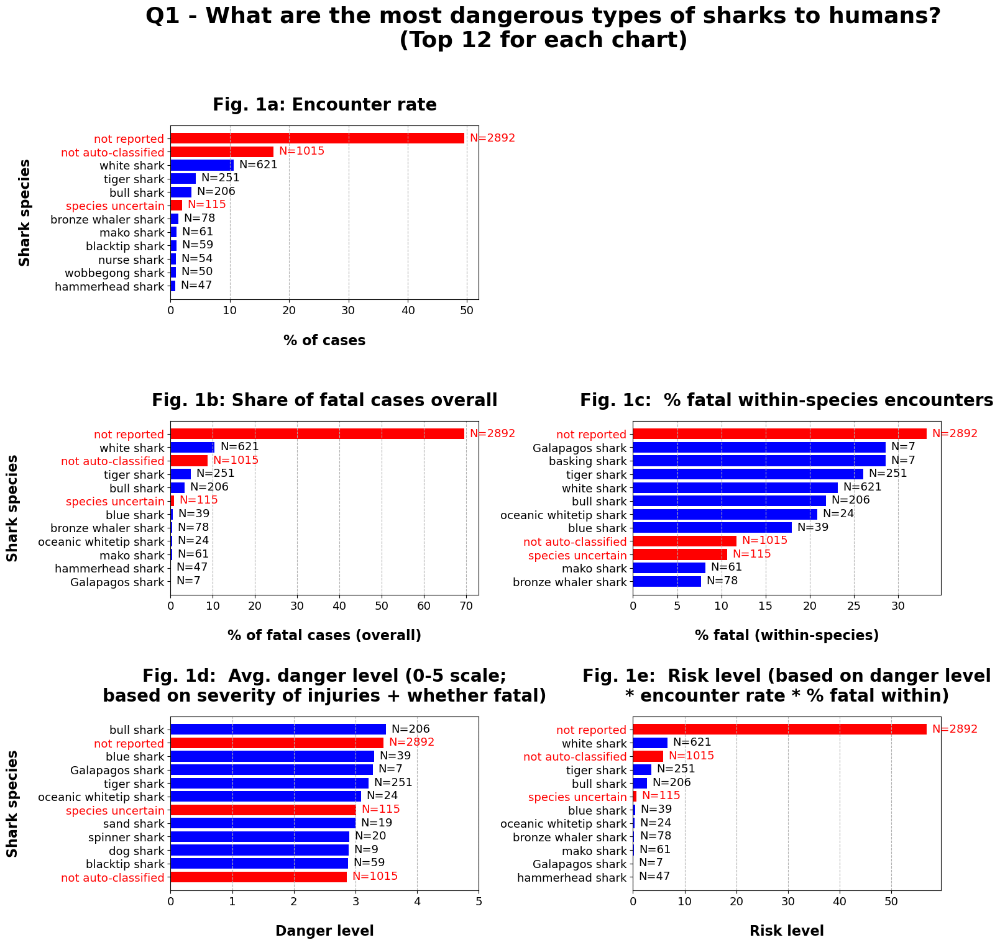

In [51]:
# To answer Question 1 in one overview, show 5 horizontal
# bar charts as subplots in a single Figure:

# Set up a 3x2 subplot matrix and give overall Figure title:
fig, ([ax1, ax2], [ax3, ax4], [ax5, ax6]) = plt.subplots(3, 2, figsize=(16, 16))#, tight_layout=True)
fig.suptitle('Q1 - What are the most dangerous types of sharks to humans?\n(Top 12 for each chart)',
             weight='bold', y=1.000, fontsize=26)

# Create the 5 subplots using the horbarchart function:
a = horbarchart(ax1, plot1_perc_overall, plot1_species, \
                plot1_titles, not_identified, 'on', plot1_N)
# ...with whitespace for the top right subplot:
fig.delaxes(ax2)
b = horbarchart(ax3, plot2_perc_fatal_overall, plot2_species, \
                plot2_titles, not_identified, 'on', plot2_N)
c = horbarchart(ax4, plot3_perc_fatal_within, plot3_species, \
                plot3_titles, not_identified, 'on', plot3_N)
d = horbarchart(ax5, plot4_danger_level, plot4_species, \
                plot4_titles, not_identified, 'on', plot4_N)
# ...and set the x-axis for "danger level" from 0 to 5:
ax5.set_xlim([0,5])
e = horbarchart(ax6, plot5_risk_level, plot5_species, \
                plot5_titles, not_identified, 'on', plot5_N)

# Adjust the spacing in between subplots, to avoid overlap:
plt.subplots_adjust(wspace=0.5,  # horizontal spacing
                    hspace=0.7)  # vertical spacing
plt.show()


<div class="alert alert-block alert-info">
    <h1>ANSWERS TO QUESTION 1:<br>What are the most dangerous types of sharks to humans?</h1><br>
    <b><em>Depending on how you define "Most dangerous", this can be answered in several ways:</em></b>

- <b>Encounter rate:</b> For most incidents in the database (\~70%), the shark species was either not reported, could not be auto-classified from the text, or was noted as "uncertain" (or as several possible species).  After that, **white sharks** were reported most often (\~11%) as single species, then **tiger** (\~4%) and **bull sharks**.  But this by itself doesn't necessarily indicate how dangerous each species is. (Although it could be argued that the species most often involved in reported incidents also harass humans most often..)<br><br>
- <b>Risk of dying:</b>
    1. Likewise, <b>white, tiger and bull sharks</b> also had the largest share in the overall nr. of fatal incidents, with roughly the same percentages; but this could simply be due to the fact that they were also encountered most often (i.e. in case all shark species would be equally fatal).
    2. In terms of the highest risk of dying only within encounters of a single species (% fatal within-species), the 5 most fatal species of sharks are <code style="background:yellow"><b>Galapagos, basking, tiger, white and bull sharks</b></code>, in this order.<br><br>
- <b>Severity of injuries, incl. whether or not fatal:</b>  "Danger level" was defined on a 0-to-5 scale, where 0 means "no injuries", 5 means"fatal" and 3 means "medium injuries" (i.e., for each individual shark encounter).  With this definition, the <code style="background:yellow"><b>bull, blue, Galapagos, tiger and oceanic whitetip sharks</b></code> are the most dangerous sharks, in this order (and the white shark is not even in the top 12).<br><br>
- <b>Overall risk level:</b>  this is roughly:  overall encounter chance * danger level * % fatal within-species.  The shark species with the highest risk factors are: <code style="background:yellow"><b>white, tiger and bull sharks</b></code>. But again, this is likely heavily influenced by overall encounter rates of these 3 species.<br><br>

    <b>In general, something to keep in mind:</b> For almost all parameters, the largest group was the "not reported" category.  If you make the assumption that the distribution of shark species was the same within the "not reported" group as for the species that <b><em>were</em></b> reported, this doesn't affect the conclusions above.  However, if for some reason some species was/were under- or over-represented in the "not reported" group - e.g., if some species are either more difficult or easier to identify than other species (i.e. resemble each other
more, or on the contrary stand out more) - that would affect the validity of the conclusions.
</div>


# MAKING BAR CHARTS - QUESTION 2:

## Are children more likely to be attacked by sharks?



In [52]:
# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )

In [53]:
# AGGREGATED DATA: age_group vs. various parameters
# -------------------------------------------------------


# 1) First create DF (a pivot table) of the average calculated
# danger_level per age group:
agegroups_danger_level = pd.pivot_table(
    data=df2,
    index='age_group',
    values='danger_level'
).sort_values(
    by='danger_level',
    ascending=False
)

# Check results:
# agegroups_danger_level


In [54]:
# 2) Pivot table of nr. of fatal incidents per age group:
nr_fatalities_per_agegroup = pd.pivot_table(
    data=df2,
    index='age_group',
    values='fatal_FINAL',
    aggfunc='sum',
    margins=True,
    margins_name = 'Total'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Transform these numbers into the overall % of all recorded fatal incidents,
# for each age group, and save as DF:
agegroups_perc_fatal_overall = 100 * (nr_fatalities_per_agegroup / total_fatal_incidents)

# Check results:
# print(nr_fatalities_per_agegroup)
# agegroups_perc_fatal_overall


In [55]:
# 3)  Create another pivot table with the % of fatal incidences
# within each age group (i.e., fatal % only within the encounters 
# with that age group), where only True and False values (of fatal_FINAL)
# are used for the calculation, and missing values in fatal_FINAL are discounted.
# 
# The calculation works bcs. True values are taken as 1 and
# False values as 0, and the pivot table gives the average
# (so a nummer between 0 and 1, which is the ratio of fatal
#  encounters just for the encounters with that particular age group).
agegroups_perc_fatal_within = 100 * pd.pivot_table(
    data=df2,
    index='age_group',
    values='fatal_FINAL',
    fill_value='unknown'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Check results
# agegroups_perc_fatal_within


In [56]:
# CREATE AGE_GROUPS DATAFRAME:

# First create Series of the aggregated numbers
# for the 3 values in the 'child_bool' column
# and name the index.  Bcs. I couldn't find a way
# to do this using the .pivot_table() method, I used
# .value_counts() instead:
s = df2['child_bool'].value_counts(dropna=False)
s.index.name = 'age_group'

# Turn this into a DF and rename column:
age_groups_df = s.to_frame('nr_incidents')

# Add columns:
age_groups_df.loc[:, '%_of_all_incidents'] = \
        100 * df2['child_bool'].value_counts(normalize=True, dropna=False)
age_groups_df.loc[:, '%_of_incidents_w_age_known'] = \
        100 * df2['child_bool'].value_counts(normalize=True, dropna=True)

# Rename index values:
age_groups_df = age_groups_df.rename({
    np.nan: "not reported",
    False: "only adult(s) (age 19+)",
    True: "incl. child(ren) (age 0-18)"
})
# P.S. note that I didn't use the 'age_group' column for the
# .value_counts() method above (which would have saved me the renaming
# of the index), bcs. in that case the 'dropna=True', needed for the 
# '%_of_incidents_w_age_known' calculation, wouldn't have worked;
# bcs. in the 'age_group' column, those missing values in the 'child_bool'
# column were represented by the string 'not reported'.

# Now add columns to the right, from the three pivot tables created
# in the earlier cells:
age_groups_df.loc[:, 'danger_level'] = agegroups_danger_level['danger_level']
age_groups_df.loc[:, '%_fatal_overall'] = agegroups_perc_fatal_overall['fatal_FINAL']
age_groups_df.loc[:, '%_fatal_within_age_group'] = agegroups_perc_fatal_within['fatal_FINAL']

# Check resulting DF:
age_groups_df


,nr_incidents,%_of_all_incidents,%_of_incidents_w_age_known,danger_level,%_fatal_overall,%_fatal_within_age_group
age_group,,,,,,
not reported,2572,44.026018,NaN,3.095118,54.826824,29.512098
only adult(s) (age 19+),2378,40.705238,72.721713,3.159509,33.087693,18.921197
incl. child(ren) (age 0-18),892,15.268744,27.278287,3.255841,12.085483,18.447694


In [57]:
# CREATE BAR CHART PARAMETERS FOR 5 PLOTS:
# 
# Create pandas series of the age groups ordered by magnitude
# for each parameter, to be used for the bar charts:

# PLOT 1: Encounter rate by age group

plot1_age_groups_df = age_groups_df.sort_values(
    by='%_of_all_incidents',
    ascending=False
)
plot1_perc_overall = plot1_age_groups_df['%_of_all_incidents']
plot1_age_groups = plot1_age_groups_df.index
plot1_titles = [
    '% of cases',
    'Age group',
    'Fig. 2a: Share of encounters'
]
plot1_N = plot1_age_groups_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# a = horbarchart(ax, plot1_perc_overall, plot1_age_groups, \
#                 plot1_titles, 'not reported', 'on', plot1_N)



In [58]:
# PLOT 2: % of encounters with children vs. % of children worldwide

plot2_y_axis = [
    'Cases w/child(ren) (age 0-18)',
    'Children worldwide (age 0-19)'
]
plot2_percentage = [
    age_groups_df.loc['incl. child(ren) (age 0-18)', '%_of_incidents_w_age_known'],
    34.323028556199  # Calculated from 2015 world population data, downloaded
                     # as CSV from https://www.populationpyramid.net/world/2015/
                     # by adding the totals for age groups 0-4, 5-9, 10-14 and 15-19
                     # and dividing by the grand total of all age groups (Male + Female).
]
plot2_titles = [
    'Percentage',
    '',
    'Fig. 2b:  % cases w/children (of cases w/age known)' \
        '\nvs. % children worldwide (2015 data)'
]

# # Check results:
# fig, ax = plt.subplots()
# b = horbarchart(ax, plot2_percentage, plot2_y_axis, \
#                 plot2_titles)

# # Set the color of the second bar and y-axis label (2015 World data) to green
# ax.get_yticklabels()[1].set_color('g')
# plt.setp(b[1], color='g')


In [59]:
# PLOT 3: Age groups overall share of fatal cases

plot3_age_groups_df = age_groups_df.sort_values(
    by='%_fatal_overall',
    ascending=False
)
plot3_perc_fatal_overall = plot3_age_groups_df['%_fatal_overall']
plot3_age_groups = plot3_age_groups_df.index
plot3_titles = [
    '% of fatal cases (overall)',
    'Age group',
    'Fig. 2c: Share of fatal cases overall'
]
plot3_N = plot3_age_groups_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# c = horbarchart(ax, plot3_perc_fatal_overall, plot3_age_groups, \
#                 plot3_titles, 'not reported', 'on', plot3_N)


In [60]:
# PLOT 4: % of fatal encounters within-age group 

plot4_age_groups_df = age_groups_df.sort_values(
    by='%_fatal_within_age_group',
    ascending=False
)
plot4_perc_fatal_within = plot4_age_groups_df['%_fatal_within_age_group']
plot4_age_groups = plot4_age_groups_df.index
# Give empty string for species y-axis label,
# for easier subplotting later on:
plot4_titles = [
    '% fatal (within age group)',
    '',
    'Fig. 2d:  % fatal encounters within age group'
]
plot4_N = plot4_age_groups_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# d = horbarchart(ax, plot4_perc_fatal_within, plot4_age_groups, \
#                 plot4_titles, 'not reported', 'on', plot4_N)


In [61]:
# PLOT 5: Danger level

plot5_age_groups_df = age_groups_df.sort_values(
    by='danger_level',
    ascending=False
)
plot5_danger_level = plot5_age_groups_df['danger_level']
plot5_age_groups = plot5_age_groups_df.index
plot5_titles = [
    'Danger level',
    'Age group',
    'Fig. 2e:  Avg. danger level (0-5 scale;' \
        '\nbased on severity of injuries + whether fatal)'
]
plot5_N = plot5_age_groups_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# ax.set_xlim([0,5])
# e = horbarchart(ax, plot5_danger_level, plot5_age_groups, \
#                 plot5_titles, 'not reported', 'on', plot5_N)



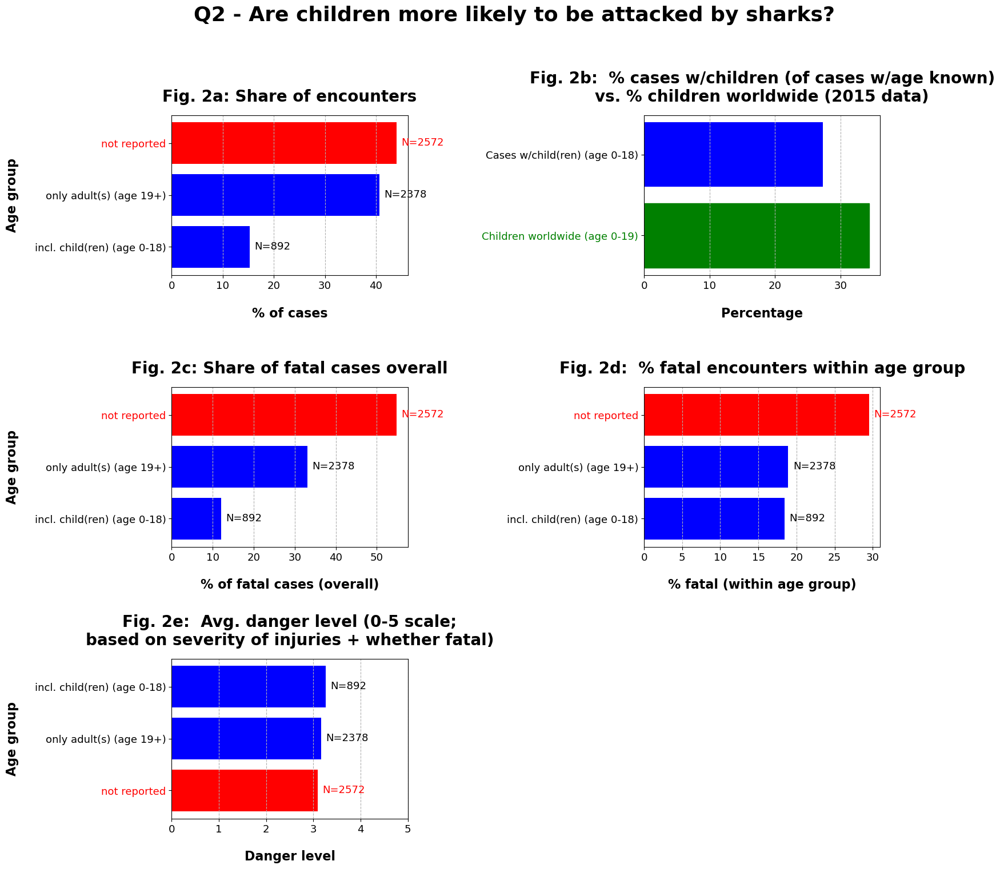

In [62]:
# To answer Question 2 in one overview, show 5 horizontal
# bar charts as subplots in a single Figure:

# Set up a 3x2 subplot matrix and give overall Figure title:
fig, ([ax1, ax2], [ax3, ax4], [ax5, ax6]) = plt.subplots(3, 2, figsize=(16, 16))#, tight_layout=True)
fig.suptitle('Q2 - Are children more likely to be attacked by sharks?',
             weight='bold', y=1.000, fontsize=26)

# Create the 5 subplots using the horbarchart function:
a = horbarchart(ax1, plot1_perc_overall, plot1_age_groups, \
                plot1_titles, 'not reported', 'on', plot1_N)
b = horbarchart(ax2, plot2_percentage, plot2_y_axis, \
                plot2_titles)
# ...set the 2015 World data to green in chart 1b:
ax2.get_yticklabels()[1].set_color('g')
plt.setp(b[1], color='g')
c = horbarchart(ax3, plot3_perc_fatal_overall, plot3_age_groups, \
                plot3_titles, 'not reported', 'on', plot3_N)
d = horbarchart(ax4, plot4_perc_fatal_within, plot4_age_groups, \
                plot4_titles, 'not reported', 'on', plot4_N)
# ...and set the x-axis for "danger level" from 0 to 5:
ax5.set_xlim([0,5])
e = horbarchart(ax5, plot5_danger_level, plot5_age_groups, \
                plot5_titles, 'not reported', 'on', plot5_N)

# ...with whitespace for the bottom right subplot:
fig.delaxes(ax6)

# Adjust the spacing in between subplots, to avoid overlap:
plt.subplots_adjust(wspace=1.0,  # horizontal spacing
                    hspace=0.7)  # vertical spacing
plt.show()

<div class="alert alert-block alert-info">
    <h1>ANSWERS TO QUESTION 2:<br>Are children more likely to be attacked by sharks?</h1><br>

<b><h3>Used definitions:</h3></b>
- For this analysis “children” were defined as ages 0 to 18 (so including 18) as taken from the “Age” column, and “adults” as ages 19 and older.<br><br>
- If the “Age” column was not filled out, the age group for that encounter was classified as “not reported”.<br><br>
- For cases where multiple people were involved in the encounter, with reported ages of both child(ren) and adult(s), they were initially classified as “mixed”.  Since this involved only 3 cases and to simplify the analysis, they were then grouped together with the age group “Incl. child(ren)”.<br><br>

<b><h3>Interpretation of the charts:</h3></b>
- Just looking at how many of the shark encounters involved children (<code style="background:yellow"><b>Fig. 2a</b></code>) may provide some information.  However, to interpret this some context is needed, i.e. the relative % of shark cases involving children (which can only be calculated for the cases where the age group is reported), i.e. 27.3%, could be compared to the % of children worldwide (<code style="background:yellow"><b>Fig. 2b</b></code>), i.e. 34.3%.<br><br>
- This latter number was calculated from 2015 world population data by age groups, downloaded as CSV file from https://www.populationpyramid.net/world/2015/, by adding the totals for age groups 0-4, 5-9, 10-14 and 15-19 and dividing by the grand total of all age groups (Male + Female).<br><br>
- <code style="background:yellow"><b>While this raw comparison seems to give some indication that children were attacked by sharks relatively less often than adults</b></code> (purely based on their share of the world population), <code style="background:yellow"><b>this should be interpreted with extreme caution</b></code>, for the following reasons:<br><br>
     * Age group 0-19 (world) is not fully comparable to age group 0-18 (shark cases), although this one year probably does not make a significant difference.<br><br>
     * The shark attack database dates back as far as 1543 (Year column), and the global population distribution by age groups has shifted dramatically over this time period (with probably a far larger share for the 0-19 age group in earlier times).  So the comparison with world population data of just one year (2015) doesn’t tell you all that much, and a deeper analysis of the distribution of the different dates for cases in the database would be needed for a better interpretation.<br><br>
     * And even if the 2015 world data would be fully representative of the share of the 0-19 age group in the world population for this entire period, it could still very well be that the share of the 0-19 age group in all situations where sharks can be encountered (swimming at the beach, shipwrecks, diving, fishing, etc.) is vastly different.  E.g. it could be that children are involved in only 5-10% of such situations, and in that case the 27.3% of overall shark cases with children would point to children indeed being attacked more often than adults.<br><br>
- Hence: no reliable conclusions can be drawn from Fig. 2b alone, and we need to look at other factors as well:<br><br>
- <code style="background:yellow"><b>Fig. 2c</b></code> shows the share in overall fatal cases for children (12.1%) vs. adults (33.1%).  Fatality is a probable indicator of sharks actually attacking (since many of the reported shark encounters may simply be just that: encounters, without the shark(s) actually attacking).  This difference is probably caused by adults also representing more overall shark encounters than children (Fig. 2a), and indeed: when calculating how many of the encounters <b>WITHIN</b> each age group were fatal (<code style="background:yellow"><b>Fig. 2d</b></code>), children and adults show roughly the same fatality rate (18.4% vs. 18.9%, respectively).<br><br>
- Finally, when looking at calculated “danger level” (which is an arbitrary measure on a 0 to 5 scale, calculated based on both the severity of injuries as well as an encounter being fatal or not; thus also indicative of whether sharks actually attacked) in <code style="background:yellow"><b>Fig. 2e</b></code>: while cases with children showed a slightly higher danger level of 3.26 than those with adults (3.16), this difference seems minor.<br><br>
    
<b><h3>Conclusion:</h3></b>
- Therefore, Figs. 2d and 2e seem to support the earlier conclusion that children are NOT more likely to be attacked than adults, although this conclusion should be interpreted with great caution for the reasons mentioned.<br><br> 
- (I.e., it might still be the case that they are more likely to be attacked, but this is just not apparent from the data that are available.)<br><br>
- So probably it would be more accurate to state: <code style="background:yellow"><b>"No indications were found that children are more likely to be attacked than adults."</b></code><br><br>

</div>

# MAKING BAR CHARTS - QUESTION 3:
## Are shark attacks where sharks were provoked more or less dangerous?




In [63]:
# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )

In [64]:
# AGGREGATED DATA: provoked_FINAL vs. various parameters
# -------------------------------------------------------


# 1) First create DF (a pivot table) of the average calculated
# danger_level for both the provoked and unprovoked cases:
provoked_danger_level = pd.pivot_table(
    data=df2,
    index='provoked_FINAL',
    values='danger_level'
).sort_values(
    by='danger_level',
    ascending=False,
)

# Check results:
# provoked_danger_level


In [65]:
# 2) SERIES (not a DF) of % of fatal incidents overall
# for provoked vs. unprovoked:

provoked_perc_fatal_overall = \
    100 * df2.loc[df2['fatal_FINAL']==True, 'provoked_FINAL'].value_counts(normalize=True, dropna=True)

# P.S. note that the same could have been achieved with .pivot_table()
# but I discovered the above is a lot shorter and more straightforward.
# At first I thought this only works with boolean values in the 'provoked_FINAL'
# column (only 2 categories, True & False), but it turns out this also works
# with many categories.

# Check results:
# provoked_perc_fatal_overall

In [66]:
# 3)  Create another pivot table with the % of fatal incidences
# WITHIN each provoked category (i.e., fatal % only within all the encounters 
# that were either provoked or unprovoked), where only True and False
# values (of fatal_FINAL) are used for the calculation, and missing
# values in fatal_FINAL are discounted.
# 
# The calculation works bcs. True values (of fatal_FINAL) are taken as 1 and
# False values as 0, and the pivot table gives the average
# (so a nummer between 0 and 1, which is the ratio of fatal encounters
# just for those encounters that were either provoked or unprovoked).
provoked_perc_fatal_within = 100 * pd.pivot_table(
    data=df2,
    index='provoked_FINAL',
    values='fatal_FINAL',
    fill_value='unknown'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Check results:
# provoked_perc_fatal_within


In [67]:
# CREATE 'PROVOKED' DATAFRAME:

# First create Series of the aggregated numbers of
# True and False values in the 'provoked_FINAL' column
# and name the index. (Pls. note that the 19 cases
# with a NaN value are ignored with 'dropna=True', as discussed 
# earlier in the rationale on how to deal with missing values.)
# 
# Because I couldn't find a way to do this using
# the .pivot_table() method, I used
# .value_counts() instead:
s = df2['provoked_FINAL'].value_counts(dropna=True)
s.index.name = 'provoked_class'

# Turn this into a DF and rename column:
provoked_df = s.to_frame('nr_incidents')

# Add column with relative shares of total
# (= total not including the 19 missing values):
provoked_df.loc[:, '%_of_incidents_w_provoked_status_known'] = \
        100 * df2['provoked_FINAL'].value_counts(normalize=True, dropna=True)

# Now add columns to the right, from the three pivot tables created
# in the earlier cells; and note that the 2nd one is a Series, not a DF,
# so no column name should be included for that one:
provoked_df.loc[:, 'danger_level'] = provoked_danger_level['danger_level']
provoked_df.loc[:, '%_fatal_overall'] = provoked_perc_fatal_overall
provoked_df.loc[:, '%_fatal_within_provoked_status'] = provoked_perc_fatal_within['fatal_FINAL']

# Rename index values:
provoked_df = provoked_df.rename({
    False: "unprovoked",
    True: "provoked"
})

# Check resulting DF:
provoked_df


,nr_incidents,%_of_incidents_w_provoked_status_known,danger_level,%_fatal_overall,%_fatal_within_provoked_status
provoked_class,,,,,
unprovoked,4874,83.702559,3.210255,94.174041,26.510276
provoked,949,16.297441,2.813760,5.825959,8.342133


In [68]:
# CREATE BAR CHART PARAMETERS FOR 3 PLOTS:
# 
# Create pandas series of the provoked vs. unprovoked categories 
# (ordered by magnitude) for each parameter, to be used for the bar charts:

# PLOT 1: Encounter rate by provoked status

plot1_provoked_df = provoked_df.sort_values(
    by='%_of_incidents_w_provoked_status_known',
    ascending=False
)
plot1_perc_overall = plot1_provoked_df['%_of_incidents_w_provoked_status_known']
plot1_provoked_categories = plot1_provoked_df.index
plot1_titles = [
    '% of cases',
    'Provoked status',
    'Fig. 3a: Share of encounters'
]
plot1_N = plot1_provoked_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# a = horbarchart(ax, plot1_perc_overall, plot1_provoked_categories, \
#                 plot1_titles, '', 'on', plot1_N)



In [69]:
# PLOT 2: % of fatal encounters within-provoked status 

plot2_provoked_df = provoked_df.sort_values(
    by='%_fatal_within_provoked_status',
    ascending=False
)
plot2_perc_fatal_within = plot2_provoked_df['%_fatal_within_provoked_status']
plot2_provoked_categories = plot2_provoked_df.index
plot2_titles = [
    '% fatal (within provoked status)',
    'Provoked status',
    'Fig. 3b:  % fatal encounters' \
        '\nwithin provoked status'
]
plot2_N = plot2_provoked_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# b = horbarchart(ax, plot2_perc_fatal_within, plot2_provoked_categories, \
#                 plot2_titles, '', 'on', plot2_N)


In [70]:
# PLOT 3: Danger level

plot3_provoked_df = provoked_df.sort_values(
    by='danger_level',
    ascending=False
)
plot3_danger_level = plot3_provoked_df['danger_level']
plot3_provoked_categories = plot3_provoked_df.index

# Give empty string for species y-axis label,
# for easier subplotting later on:
plot3_titles = [
    'Danger level',
    '',
    'Fig. 3c:  Avg. danger level (0-5 scale;' \
        '\nbased on severity of injuries + whether fatal)'
]
plot3_N = plot3_provoked_df['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# ax.set_xlim([0,5])
# c = horbarchart(ax, plot3_danger_level, plot3_provoked_categories, \
#                 plot3_titles, '', 'on', plot3_N)



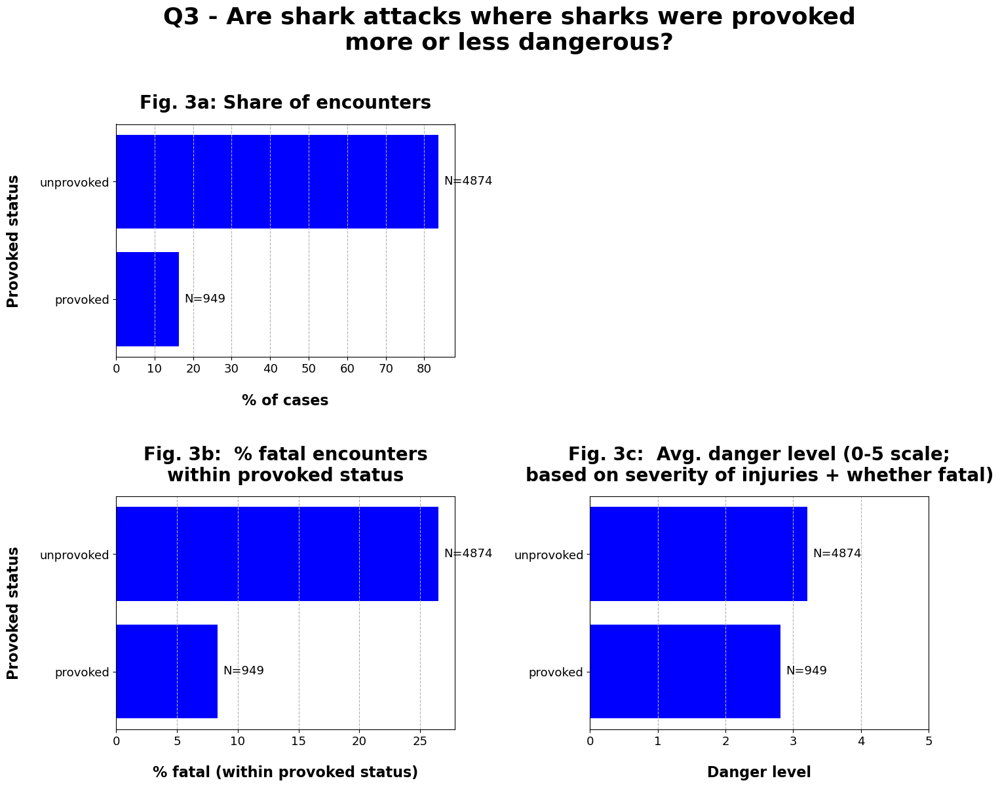

In [71]:
# To answer Question 3 in one overview, show 3 horizontal
# bar charts as subplots in a single Figure:

# Set up a 2x2 subplot matrix and give overall Figure title:
fig, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize=(16, 12))#, tight_layout=True)
fig.suptitle('Q3 - Are shark attacks where sharks were provoked' \
                 '\nmore or less dangerous?',
             weight='bold', y=1.030, fontsize=26)

# Create the 3 subplots using the horbarchart function:
a = horbarchart(ax1, plot1_perc_overall, plot1_provoked_categories, \
                plot1_titles, '', 'on', plot1_N)
# ...with whitespace for the top right subplot:
fig.delaxes(ax2)

b = horbarchart(ax3, plot2_perc_fatal_within, plot2_provoked_categories, \
                plot2_titles, '', 'on', plot2_N)
# ...and set the x-axis for "danger level" from 0 to 5:
ax4.set_xlim([0,5])
c = horbarchart(ax4, plot3_danger_level, plot3_provoked_categories, \
                plot3_titles, '', 'on', plot3_N)

# Adjust the spacing in between subplots, to avoid overlap:
plt.subplots_adjust(wspace=0.4,  # horizontal spacing
                    hspace=0.6)  # vertical spacing
plt.show()

<div class="alert alert-block alert-info">
    <h1>ANSWERS TO QUESTION 3:<br>Are shark attacks where sharks were provoked more or less dangerous?</h1><br>

<b><h3>Definition and assumptions:</h3></b>
- My classification of whether a case was labeled as <b>‘provoked’ or ‘unprovoked’</b> was more liberal/ encompassing than the classification in the ‘Type’ column of the original database:<br><br>
    - While I always kept the ‘provoked’ label if it was present in the ‘Type’ column, I assumed that ALL other cases were ‘unprovoked’ by default, also the cases where the ‘unprovoked’ label was not explicitly mentioned in the ‘Type’ column (so e.g. also where it said ‘boating’, I assumed those cases were also ‘unprovoked’ by default).  This seems the safest assumption, as ‘provoked’ is the exception and in normal circumstances, people don’t try to attract sharks.<br><br>
    - However, next and on top of that I also looked at the ‘Activity’ column, and assumed that a number of activities (such as spearfishing, which can cause blood in the water; fishing for sharks; feeding or tagging sharks, etc.) are likely to provoke sharks, even when it’s unintentional – and even when the ‘Type’ column said ‘unprovoked’.  Pls. see the data cleaning phase above for all specific substrings that I assumed to be an indication of likely provoking.  There are 347 cases in the cleaned and reduced df2 where the ‘Type’ column says ‘unprovoked’, but which I still classified as ‘provoked’ based on the activity, thus assuming that the ‘unprovoked’ label in the ‘Type’ column was not justified for those cases.<br><br>
- This <b>more liberal definition of provoking</b> will of course affect the results and conclusion (maybe different results would be found if only the strict ‘provoked’ and ‘unprovoked’ labels in the ‘Type’ column would be used), but I think my definition makes the most sense and will lead to more reliable conclusions.<br><br>
- As for the <b>definition of ‘dangerous’</b>, I took the same approach as in answering Q1 (which shark types are the most dangerous?) and looked both at the within-group fatality rates, as well as a calculated ‘danger level’, which on a 0-5 scale takes into account both the severity of injuries and whether or not a case was fatal.<br><br>

<b><h3>Results and conclusion:</h3></b>
- Using my definition, it was found that about 1 in 6 encounters was ‘provoked’ (Fig. 3a).<br><br>
- Surprisingly, it was found that <code style="background:yellow"><b>provoked encounters were less deadly</b></code>, with a within-status fatality rate of 8.3% for provoked cases, vs. 26.5% for unprovoked cases (Fig. 3b)...;<br><br>
- <code style="background:yellow"><b>...and also had a lower danger level</b></code> (on a 0-5 scale) of 2.81, vs. 3.21 for the unprovoked cases (Fig. 3c).<br><br>
- <code style="background:yellow"><b>Thus it can be concluded that cases where sharks were provoked (at least according to the definition of ‘provoked’ that I used) were actually LESS dangerous than unprovoked cases</b></code>, in the sense of a significantly higher survival rate and less severe injuries.<br><br>
- A possible explanation for this could be that in situations where sharks were assumed to be provoked, people were probably also more alert about the possibility of a shark attack, and better able to defend themselves, e.g. to make a defensive stance in the water which could have deterred the sharks from attacking or pursuing/continuing the attack.  In other words, the surprise factor could have been largely taken out of the equation, leading to less dangerous attacks.<br><br>

</div>

# MAKING BAR CHARTS - QUESTION 4:

## Are certain activities more likely to result in a shark attack?



In [72]:
# iTables check:
# show(
#     df2,
#     scrolly="1000px",
#     maxBytes=0
# )

In [73]:
# AGGREGATED DATA: activity vs. various parameters
# -------------------------------------------------------


# 1) First create DF (a pivot table) of the average calculated
# danger_level for both the provoked and unprovoked cases:
activities_danger_level = pd.pivot_table(
    data=df2,
    index='activity',
    values='danger_level'
).sort_values(
    by='danger_level',
    ascending=False,
)

# Check results:
# activities_danger_level


In [74]:
# 2) Pivot table of nr. of fatal incidents per activity:
nr_fatalities_per_activity = pd.pivot_table(
    data=df2,
    index='activity',
    values='fatal_FINAL',
    aggfunc='sum'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Transform these numbers into the overall % of all recorded fatal incidents,
# for each species, and save as DF:
activities_perc_fatal_overall = 100 * (nr_fatalities_per_activity / total_fatal_incidents)

# Check results:
# activities_perc_fatal_overall.head(13)


In [75]:
# 3)  Create another pivot table with the % of fatal incidences
# WITHIN each activity, where only True and False values (of
# fatal_FINAL) are used for the calculation, and missing values
# in fatal_FINAL are discounted.
# 
# The calculation works bcs. True values (of fatal_FINAL) are taken as 1 and
# False values as 0, and the pivot table gives the average
# (so a nummer between 0 and 1, which is the ratio of fatal encounters
# just for those encounters that were either provoked or unprovoked).
activities_perc_fatal_within = 100 * pd.pivot_table(
    data=df2,
    index='activity',
    values='fatal_FINAL'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Check results:
# activities_perc_fatal_within


In [76]:
# CREATE 'ACTIVITIES' DATAFRAME:

# First create Series of the aggregated numbers of
# each activity in the 'activities' column
# and name the index:
s = df2['activity'].value_counts(dropna=True)
s.index.name = 'activity'

# Turn this into a DF and rename column:
activities_df = s.to_frame('nr_incidents')

# Add column with relative shares of total:
activities_df.loc[:, '%_of_all_incidents'] = \
        100 * df2['activity'].value_counts(normalize=True, dropna=True)

# Now add columns to the right, from the three pivot tables created
# in the earlier cells:
activities_df.loc[:, 'danger_level'] = activities_danger_level['danger_level']
activities_df.loc[:, '%_fatal_overall'] = activities_perc_fatal_overall['fatal_FINAL']
activities_df.loc[:, '%_fatal_within_activity'] = activities_perc_fatal_within['fatal_FINAL']

# Check resulting DF:
# activities_df.head(50)


In [77]:
# FILTERING RESULTS:
# 
# As a lest step, apply a filter so that only activities
# with at least 10 recorded incidents are included;
# this to ensure that the sample size of each activity
# is sufficient (although the minimum of 10 is of course somewhat
# arbitrary), thus ensuring that conclusions are trustworthy:
activities_df2 = activities_df.loc[activities_df['nr_incidents'] > 9]

# Alternatively, you could also apply a filter on
# the % of incidents; say, only activities that were involved
# in at least 1 % of incidents:
# activities_df.loc[activities_df['%_of_all_incidents'] > 1]

# Check resulting DF:
# activities_df2 #.head()
# activities_df2.sort_values(
#     by='nr_incidents',
#     ascending=False
# )

In [78]:
# CREATE BAR CHART PARAMETERS FOR 3 PLOTS:
# 
# Create pandas series of the activities(ordered by magnitude)
# for each parameter, to be used for the bar charts:

# PLOT 1: Encounter rate by activity

plot1_activities_df2 = activities_df2.sort_values(
    by='%_of_all_incidents',
    ascending=False
)
plot1_perc_overall = plot1_activities_df2.head(12)['%_of_all_incidents']
plot1_activities = plot1_activities_df2.head(12).index
plot1_titles = [
    '% of cases',
    'Activity',
    'Fig. 4a: Share of encounters'
]
plot1_N = plot1_activities_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# a = horbarchart(ax, plot1_perc_overall, plot1_activities, \
#                 plot1_titles, 'Not reported', 'on', plot1_N)



In [79]:
# PLOT 2: % of fatal encounters within each activity 

plot2_activities_df2 = activities_df2.sort_values(
    by='%_fatal_within_activity',
    ascending=False
)
plot2_perc_fatal_within = plot2_activities_df2.head(12)['%_fatal_within_activity']
plot2_activities = plot2_activities_df2.head(12).index
plot2_titles = [
    '% fatal (within activity)',
    'Activity',
    'Fig. 4b:  % fatal encounters' \
        '\nwithin each activity'
]
plot2_N = plot2_activities_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# b = horbarchart(ax, plot2_perc_fatal_within, plot2_activities, \
#                 plot2_titles, 'Not reported', 'on', plot2_N)


In [80]:
# PLOT 3: Danger level

plot3_activities_df2 = activities_df2.sort_values(
    by='danger_level',
    ascending=False
)
plot3_danger_level = plot3_activities_df2.head(12)['danger_level']
plot3_activities = plot3_activities_df2.head(12).index

# Give empty string for species y-axis label,
# for easier subplotting later on:
plot3_titles = [
    'Danger level',
    '',
    'Fig. 4c:  Avg. danger level (0-5 scale;' \
        '\nbased on severity of injuries + whether fatal)'
]
plot3_N = plot3_activities_df2.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# ax.set_xlim([0,5])
# c = horbarchart(ax, plot3_danger_level, plot3_activities, \
#                 plot3_titles, 'Not reported', 'on', plot3_N)



In [81]:
# PART 2:
# THROW OUT ALL CASES WITH MISSING SHARK SPECIES
# & REDO THE ENTIRE ACTIVITIES ANALYSIS:

# Create a reduced copy of the df2 database (called df3) with all
# cases with a missing value in the 'species' column
# (i.e., where the 'species_cleaned' column contains 'not reported')
# thrown out, reducing the DF by about 50%.
# 
# The reason for this will be explained in the Conclusions section
# below, but in short: we can't be sure that all the cases where
# a shark species was not filled in actually involve shark attacks,
# or are just cases where sharks scavenged on the dead bodies
# post-mortem.  Especially relevant for the activity "Fell overboard".

df3 = df2.loc[df2['species_cleaned']!='not reported']


# iTables check of the reduced DataFrame, df3:
# show(
#     df3,
#     scrolly="1000px",
#     maxBytes=0
# )


In [82]:
# AGGREGATED DATA: activity vs. various parameters
# -------------------------------------------------------


# 1) First create DF (a pivot table) of the average calculated
# danger_level for both the provoked and unprovoked cases:
activities_danger_level_df3 = pd.pivot_table(
    data=df3,
    index='activity',
    values='danger_level'
).sort_values(
    by='danger_level',
    ascending=False,
)

# Check results:
# activities_danger_level_df3


In [83]:
# 2) Pivot table of nr. of fatal incidents per activity:
nr_fatalities_per_activity_df3 = pd.pivot_table(
    data=df3,
    index='activity',
    values='fatal_FINAL',
    aggfunc='sum'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Transform these numbers into the overall % of all recorded fatal incidents,
# for each species, and save as DF:
activities_perc_fatal_overall_df3 = 100 * (nr_fatalities_per_activity_df3 / total_fatal_incidents)

# Check results:
# activities_perc_fatal_overall_df3.head(13)


In [84]:
# 3)  Create another pivot table with the % of fatal incidences
# WITHIN each activity, where only True and False values (of
# fatal_FINAL) are used for the calculation, and missing values
# in fatal_FINAL are discounted.
# 
# The calculation works bcs. True values (of fatal_FINAL) are taken as 1 and
# False values as 0, and the pivot table gives the average
# (so a nummer between 0 and 1, which is the ratio of fatal encounters
# just for those encounters that were either provoked or unprovoked).
activities_perc_fatal_within_df3 = 100 * pd.pivot_table(
    data=df3,
    index='activity',
    values='fatal_FINAL'
).sort_values(
    by='fatal_FINAL',
    ascending=False
)

# Check results:
# activities_perc_fatal_within_df3


In [85]:
# CREATE 'ACTIVITIES_df3' DATAFRAME:

# First create Series of the aggregated numbers of
# each activity in the 'activities' column
# and name the index:
s_df3 = df3['activity'].value_counts(dropna=True)
s_df3.index.name = 'activity'

# Turn this into a DF and rename column:
activities_df3 = s_df3.to_frame('nr_incidents')

# Add column with relative shares of total:
activities_df3.loc[:, '%_of_all_incidents'] = \
        100 * df3['activity'].value_counts(normalize=True, dropna=True)

# Now add columns to the right, from the three pivot tables created
# in the earlier cells:
activities_df3.loc[:, 'danger_level'] = activities_danger_level_df3['danger_level']
activities_df3.loc[:, '%_fatal_overall'] = activities_perc_fatal_overall_df3['fatal_FINAL']
activities_df3.loc[:, '%_fatal_within_activity'] = activities_perc_fatal_within_df3['fatal_FINAL']

# Check resulting DF:
# activities_df3.head(50)


In [86]:
# FILTERING RESULTS - PART 2:
# 
# As a lest step, apply a filter so that only activities
# with at least 10 recorded incidents are included;
# this to ensure that the sample size of each activity
# is sufficient (although the minimum of 10 is of course somewhat
# arbitrary), thus ensuring that conclusions are trustworthy:
activities_df4 = activities_df3.loc[activities_df3['nr_incidents'] > 9]

# Alternatively, you could also apply a filter on
# the % of incidents; say, only activities that were involved
# in at least 1 % of incidents:
# activities_df.loc[activities_df['%_of_all_incidents'] > 1]

# Check resulting DF:
# activities_df4 #.head()
# activities_df4.sort_values(
#     by='nr_incidents',
#     ascending=False
# )

In [87]:
# CREATE BAR CHART PARAMETERS FOR 3 ADDITIONAL PLOTS:
# 
# Create pandas series of the activities(ordered by magnitude)
# for each parameter, to be used for the bar charts:

# PLOT 4: Encounter rate by activity

plot4_activities_df4 = activities_df4.sort_values(
    by='%_of_all_incidents',
    ascending=False
)
plot4_perc_overall = plot4_activities_df4.head(12)['%_of_all_incidents']
plot4_activities = plot4_activities_df4.head(12).index
plot4_titles = [
    '% of cases',
    'Activity',
    'Fig. 4d: Share of encounters' \
        '\n(only w/shark species reported)'
]
plot4_N = plot4_activities_df4.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# a = horbarchart(ax, plot4_perc_overall, plot4_activities, \
#                 plot4_titles, 'Not reported', 'on', plot4_N)



In [88]:
# PLOT 5: % of fatal encounters within each activity 

plot5_activities_df4 = activities_df4.sort_values(
    by='%_fatal_within_activity',
    ascending=False
)
plot5_perc_fatal_within = plot5_activities_df4.head(12)['%_fatal_within_activity']
plot5_activities = plot5_activities_df4.head(12).index
plot5_titles = [
    '% fatal (within activity)',
    'Activity',
    'Fig. 4e:  % fatal encounters' \
        '\nwithin each activity'
]
plot5_N = plot5_activities_df4.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# b = horbarchart(ax, plot5_perc_fatal_within, plot5_activities, \
#                 plot5_titles, 'Not reported', 'on', plot5_N)


In [89]:
# PLOT 6: Danger level

plot6_activities_df4 = activities_df4.sort_values(
    by='danger_level',
    ascending=False
)
plot6_danger_level = plot6_activities_df4.head(12)['danger_level']
plot6_activities = plot6_activities_df4.head(12).index

# Give empty string for species y-axis label,
# for easier subplotting later on:
plot6_titles = [
    'Danger level',
    '',
    'Fig. 4f:  Avg. danger level (0-5 scale;' \
        '\nbased on severity of injuries + whether fatal)'
]
plot6_N = plot6_activities_df4.head(12)['nr_incidents']

# Check results:
# fig, ax = plt.subplots()
# ax.set_xlim([0,5])
# c = horbarchart(ax, plot6_danger_level, plot6_activities, \
#                 plot6_titles, 'Not reported', 'on', plot6_N)



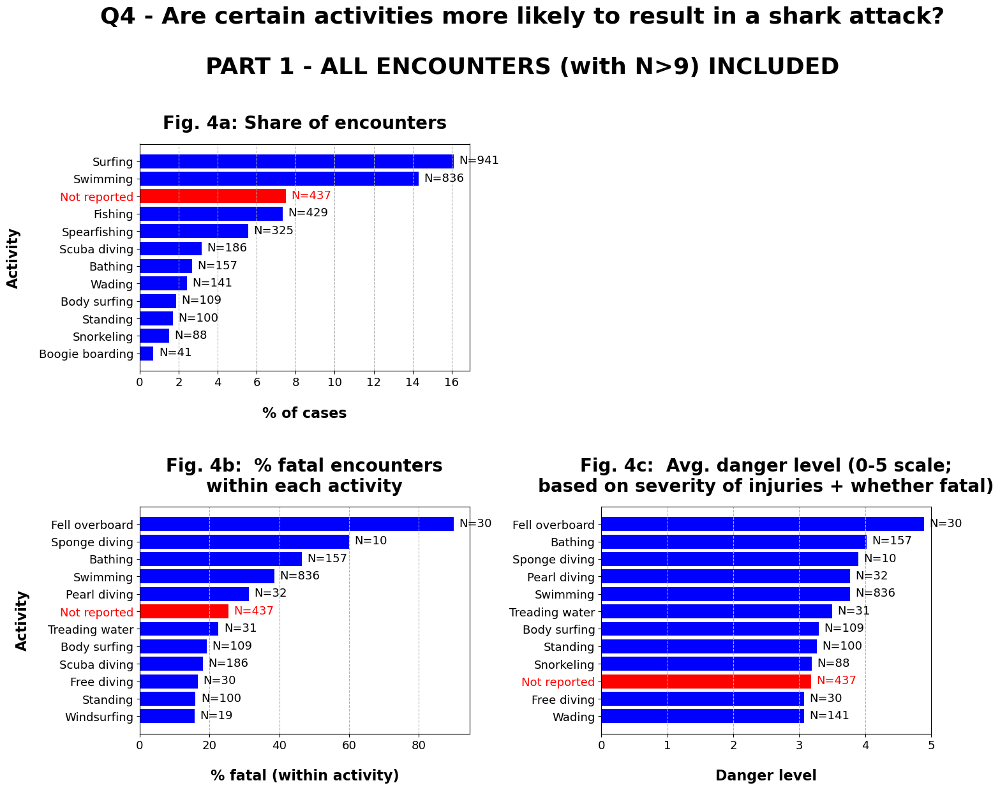

In [90]:
# CHARTS FOR PART 1:  Analysis of all encounters
# 
# To answer Question 4 in one overview, show 3 horizontal
# bar charts as subplots in a single Figure:


# Set up a 2x2 subplot matrix and give overall Figure title:
fig, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize=(16, 12))#, tight_layout=True)
fig.suptitle('Q4 - Are certain activities more likely to result ' \
                 'in a shark attack?' \
                 '\n\nPART 1 - ALL ENCOUNTERS (with N>9) INCLUDED',
             weight='bold', y=1.060, fontsize=26)

# Create the 3 subplots using the horbarchart function:
a = horbarchart(ax1, plot1_perc_overall, plot1_activities, \
                plot1_titles, 'Not reported', 'on', plot1_N)
# ...with whitespace for the top right subplot:
fig.delaxes(ax2)

b = horbarchart(ax3, plot2_perc_fatal_within, plot2_activities, \
                plot2_titles, 'Not reported', 'on', plot2_N)
# ...and set the x-axis for "danger level" from 0 to 5:
ax4.set_xlim([0,5])
c = horbarchart(ax4, plot3_danger_level, plot3_activities, \
                plot3_titles, 'Not reported', 'on', plot3_N)

# Adjust the spacing in between subplots, to avoid overlap:
plt.subplots_adjust(wspace=0.4,  # horizontal spacing
                    hspace=0.6)  # vertical spacing
plt.show()

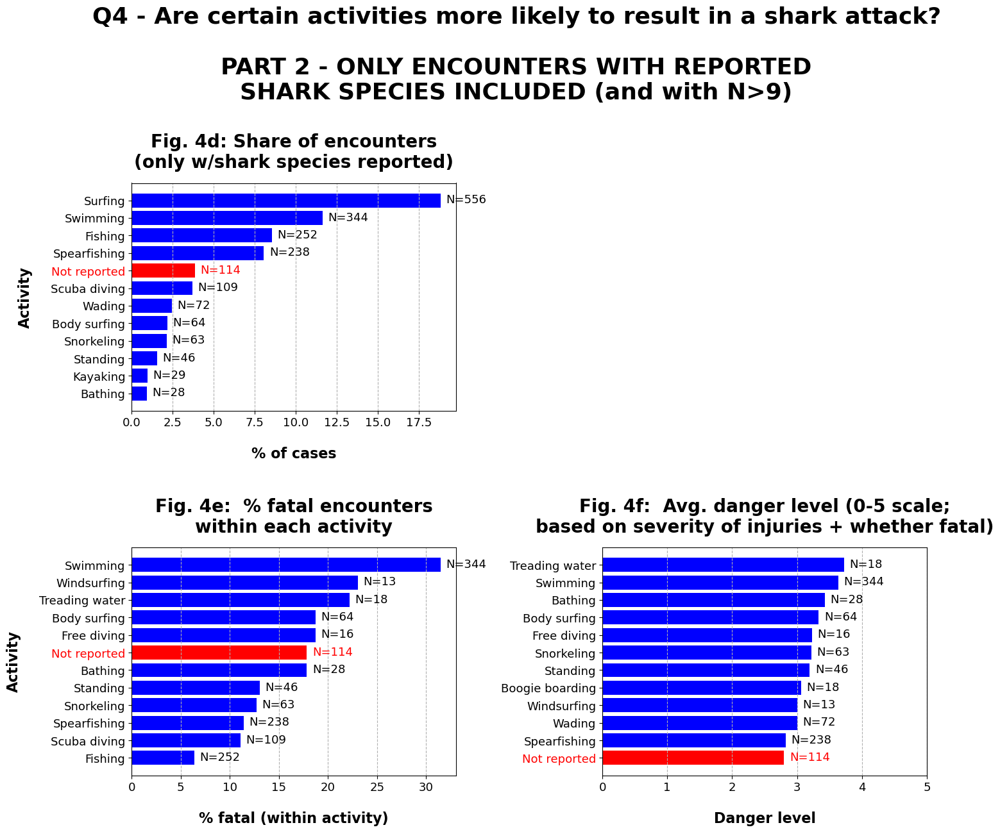

In [91]:
# CHARTS FOR PART 2:  only encounters with shark species reported
# 
# To answer Question 4 in one overview, show 3 horizontal
# bar charts as subplots in a single Figure:


# Set up a 2x2 subplot matrix and give overall Figure title:
fig, ([ax1, ax2], [ax3, ax4]) = plt.subplots(2, 2, figsize=(16, 12))#, tight_layout=True)
fig.suptitle('Q4 - Are certain activities more likely to result' \
                 ' in a shark attack?' \
                 '\n\nPART 2 - ONLY ENCOUNTERS WITH REPORTED' \
                 '\nSHARK SPECIES INCLUDED (and with N>9)',
             weight='bold', y=1.110, fontsize=26)

# Create the 3 subplots using the horbarchart function:
a = horbarchart(ax1, plot4_perc_overall, plot4_activities, \
                plot4_titles, 'Not reported', 'on', plot4_N)
# ...with whitespace for the top right subplot:
fig.delaxes(ax2)

b = horbarchart(ax3, plot5_perc_fatal_within, plot5_activities, \
                plot5_titles, 'Not reported', 'on', plot5_N)
# ...and set the x-axis for "danger level" from 0 to 5:
ax4.set_xlim([0,5])
c = horbarchart(ax4, plot6_danger_level, plot6_activities, \
                plot6_titles, 'Not reported', 'on', plot6_N)

# Adjust the spacing in between subplots, to avoid overlap:
plt.subplots_adjust(wspace=0.45,  # horizontal spacing
                    hspace=0.6)  # vertical spacing
plt.show()

<div class="alert alert-block alert-info">
    <h1>ANSWERS TO QUESTION 4:<br>Are certain activities more likely to result in a shark attack?</h1><br>

<b><h3>Analysis notes:</h3></b>
- Because of the large number of unique activity strings in the ‘activity’ column (close to 1,400), <b>only some minor data cleaning</b> was done on this column, i.e. only merging a few of the largest actvities for which it was obvious they were the same (e.g. ‘Fishing for sharks’ and ‘Shark fishing’).  Please see the earlier data cleaning cell for details.<br><br>
- Because this data cleaning and these merges were not exhaustive/ all-encompassing, some biases might have been introduced.  However, by cleaning at least the activity strings with the largest numbers of cases, such potential biases are likely kept to a minimum.<br><br>
- In the same vein, while quite a few activities were obviously subcategories of other overarching activities (e.g. the various forms of fishing), I made the choice to keep them as-is.  If such subcategory activities would have been grouped together, perhaps the differences between some overarching activities might have stood out stronger.<br><br>
- A (quite arbitrary) filter was applied to <b>include all activity strings that were listed in at least 10 cases</b>, in order to make results and conclusions more statistically reliable (but without applying actual statistical tests).<br><br>
- The same three charts were plotted as for question 3: the % of encounters overall; % of fatal cases within each activity; and average calculated “danger level” (on a 0-to-5 scale) per activity.  The latter two are assumed to be indicative of sharks actually attacking (vs. just random encounters), but see the caveat below.<br><br>
    
<b><h3>Results - Part 1:</h3></b>
- In part 1 of the analysis (which included all the cases in df2), it was found that during shark encounters <code style="background:yellow"><b>the 5 most common activities (Fig. 4a) were: surfing (16.1%), swimming (14.3%), fishing (7.3%), spearfishing (5.6%) and scuba diving (3.2%).</b></code><br><br>
- This doesn’t mean that sharks also attacked most often during those activities, because it could well be that engaging in those activities just gave the highest chance of random shark encounters.  Actual injuries and fatalities on the other hand are likely indicators of sharks also attacking:<br><br>
- <code style="background:yellow"><b>The 5 deadliest activities (Fig. 4b) were (by far) falling overboard (90.0% within-activity fatality rate), followed by sponge diving (60.0%), bathing (46.5%), swimming (38.6%) and pearl diving (31.3%).</b></code><br><br>
- It might be argued that swimming and bathing belong to the same activity and should be merged, but I chose to keep them apart as there is a subtle difference.<br><br>
- <code style="background:yellow"><b>Likewise, those same 5 activities also had the highest calculated ‘danger levels’ (Fig. 4c), although in a different order</b></code>, with notably a very high danger level for falling overboard (4.9 on a 0-to-5 scale).<br><br>
- Because of the unexpectedly high fatality rate and danger level for ‘falling overboard’, I did a manual sanity check by looking at how many of those cases also had the shark species reported.<br><br>
- Rationale: if the ‘species’ column was not filled out, this might be an indication that a case was only reported in the database because there were signs of post-mortem shark scavenging, but with no actual eye witnesses as to which shark species it involved.  Such cases should arguably not be included under ‘shark attacks’, because the most likely cause of death in most of those cases is drowning, so before there was any shark involvement.<br><br>
- Indeed it was found that most cases with activity ‘fell overboard’ had the ‘species’ column not filled out and were mostly older cases from the 1800s, when the ‘species’ column might not have been part of the questionnaire yet. The 90% fatality could thus also be a result of reporting bias if it was mostly drowned people (with shark scavenging wounds) that were reported in the database, and no reporting if they were rescued/ hauled back on board.<br><br>
- For this reason, I decided to <code style="background:yellow"><b>redo the analysis for only those cases where the ‘species’ column was filled out</b></code>, i.e. excluding all ‘not reported’ cases in the ‘species_cleaned’ column (but keeping the cases with ‘not auto-classified’ or ‘species uncertain’).<br><br>

<b><h3>Results - Part 2:</h3></b>
- In part 2 of the analysis (including only the cases in df2 with the ‘species’ column filled out), it was found that during shark encounters <code style="background:yellow"><b>the 5 most common activities (Fig. 4d) were the same as in Part 1</b></code>: surfing (18.8%), swimming (11.7%), fishing (8.5%), spearfishing (8.1%) and scuba diving (3.7%).<br><br>
- <code style="background:yellow"><b>The 5 deadliest activities, however (Fig. 4e) were different in Part 2: swimming (31.5% within-activity fatality rate), windsurfing (23.1%), treading water (22.2%), body surfing and free diving (both 18.8%).</b></code><br><br>
- Likewise, <code style="background:yellow"><b>the activities with the highest calculated ‘danger level’ (Fig. 4f) were treading water (3.7 on a 0-to-5 scale), followed by swimming (3.6), bathing (3.4), body surfing (3.3) and free diving (3.2)</b></code>, and windsurfing on place 9 with a level of 3.0.<br><br>
- Note that falling overboard has now completely disappeared from the top 12 most dangerous activities – as expected from the manual check before – but, unexpectedly, the same applies to sponge diving and pearl diving.<br><br>
- Manual inspection of those two activities shows that indeed for the majority of cases the ‘species’ column was not filled out, but when checking the comments in the ‘injury’ column, many cases indicated that sharks had bitten the divers.<br><br>
- I also noticed that most of these cases were from the early 1900s and before (maybe when sponge and pearl diving was more common, as a source of income), and it could very well be that the ‘species’ question was not part of the questionnaire back then.<br><br>
- So <code style="background:yellow"><b>my tentative conclusion is that sponge and pearl diving should still be counted amongst the most dangerous activities</b></code> in terms of being attacked by sharks, and that their exclusion from part 2 of the analysis was likely unjustified.<br><br>
    
<b><h3>Conclusions:</h3></b>
- The analysis showed that <code style="background:yellow"><b>indeed some activities are more likely to result in shark attacks than others</b></code>, although no tests were done to show that the differences between activities are also statistically significant.<br><br>
- <code style="background:yellow"><b>The most dangerous activities</b></code> in terms of frequency of shark attacks in the database and the level of injuries/fatalities are, more or less in this order: <code style="background:yellow"><b>swimming/ bathing, treading water, sponge diving, pearl diving, body surfing, free diving and windsurfing.</b></code><br><br>
- Please keep in mind that this is <b>based only on the relative prevalence of these activities in the shark attack database, and their level of injuries and fatal cases</b>; it does not necessarily reflect the OVERALL likelihood for each of these activities to be attacked by sharks, because for that % we would also need to know how often each activity occurs in general (the denominator in the equation); e.g. people swimming likely occurs much more often worldwide than pearl diving, and therefore the risk of shark attack might actually be very low for swimming.<br><br>
- In general it’s <code style="background:yellow"><b>also not a good idea to fall overboard (by far the most dangerous 'activity' in part 1 of the analysis, in terms of % fatality)</b></code>, although it cannot be verified that the high fatality was caused by shark attacks.  A more likely explanation for their prevalence in the database seems to be that sharks scavenged on drowned passengers post-mortem, and thus the high fatality might be a result of reporting bias.<br><br>
    
</div>

<div class="alert alert-block alert-success">

<h1>Summary & overall conclusions</h1>

<b><h3>Answer to Q1:</h3></b>
- If only the <b>within-species encounters fatality rate</b> is considered (so once that species is encountered), the top-5 most dangerous sharks are: <code style="background:yellow"><b>Galapagos, basking, tiger, white and bull sharks.</b></code><br><br>
- If, on top of the fatality rate, also the <b>severity of injuries</b> is considered, the top-5 most dangerous are: <code style="background:yellow"><b>bull, blue, Galapagos, tiger and oceanic whitetip sharks.</b></code><br><br>
- However, the most dangerous shark species in terms of <b>overall risk level</b> (which includes the chance of actually encountering them) are <code style="background:yellow"><b>white, tiger, and bull sharks.</b></code><br><br>

<b><h3>Answer to Q2:</h3></b>
<code style="background:yellow"><b>No indications were found that children are more likely to be attacked than adults.</b></code><br><br>

<b><h3>Answer to Q3:</h3></b>
<code style="background:yellow"><b>Cases where sharks were provoked</b></code> (according to the quite liberal definition of ‘provoked’ that I used) <code style="background:yellow"><b>were LESS dangerous</b></code> than unprovoked cases.<br><br>

<b><h3>Answer to Q4:</h3></b>
- Certain activities are more likely to result in a shark attack than others (but only in terms of frequency of occurence in the database and their level of injuries and fatal cases).  These are, more or less in order of highest likelihood of attack:  <code style="background:yellow"><b>swimming/ bathing, treading water, sponge diving, pearl diving, body surfing, free diving and windsurfing.</b></code><br><br>
- Falling overboard is also risky in terms of a 90% within-activity fatality rate, but it’s questionable whether this is caused by actual shark attacks and is likely a result of reporting bias.<br><br>

<b><h3>Disclaimer:</h3></b>
Please see each of the corresponding bar charts and light-blue markdown cells above (one for each question) for additional details, used methods, assumptions and their potential biases, as well as potential caveats in interpreting these results.

</div>